# Regularized FEVD estimation
## Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np
import scipy as sp

import matplotlib.pyplot as plt
import seaborn as sns
import missingno as mno

import networkx as nx
import datetime as dt

from sklearn.model_selection import GridSearchCV

import sys
sys.path.append('../')

import src

sys.path.append('../../kungfu/')
import kungfu as kf

/home/rubelrennfix/.virtualenvs/euraculus/lib/python3.6/site-packages/pandas_datareader/compat/__init__.py:7: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  from pandas.util.testing import assert_frame_equal


## Load Data

In [3]:
year = 2020
month = 12

In [6]:
df_data = src.loader.load_monthly_estimation_data(year, month, column=None)
df_spy = src.loader.load_spy()

In [7]:
df_idio_var = df_data['idiosyncratic'].unstack()
df_var = df_data['total'].unstack()
df_spy_var = df_spy[df_spy.index.isin(df_idio_var.index)][['var']]

In [8]:
# df_log_idio_var = df_data['logvar_capm'].unstack() # this is to use the log regression residuals

In [9]:
ticker_list = list(df_data.ticker.unstack().tail(1).values.ravel())

# handle BRK share classes
c = 0
for i, ticker in enumerate(ticker_list):
    if ticker == 'BRK':
        if c == 0:
            ticker_list[i] = ticker+'.A'
            c += 1
        elif c == 1:
            ticker_list[i] = ticker+'.B'
            c += 1
        else:
            raise Error('too many tickers')
            
column_to_ticker = {k: v for k, v in enumerate(ticker_list)} #dict(pd.read_csv('../data/processed/annual/{}/tickers.csv'.format(year))['permno_to_ticker'])

## Data Summary & Processing

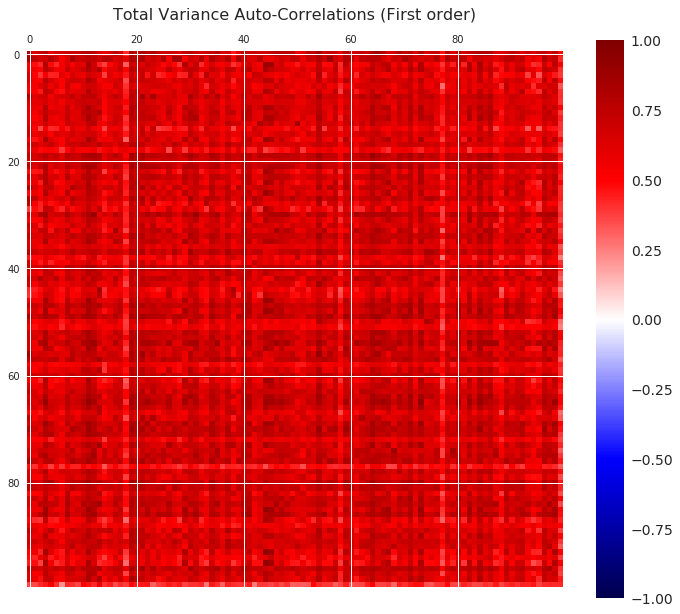

In [10]:
src.plot.corr_heatmap(src.utils.autocorrcoef(df_var, lag=1), title='Total Variance Auto-Correlations (First order)',
                         save_path='../reports/figures/estimation/heatmap_total_variance_autocorrelation.pdf')

<Figure size 1224x576 with 0 Axes>

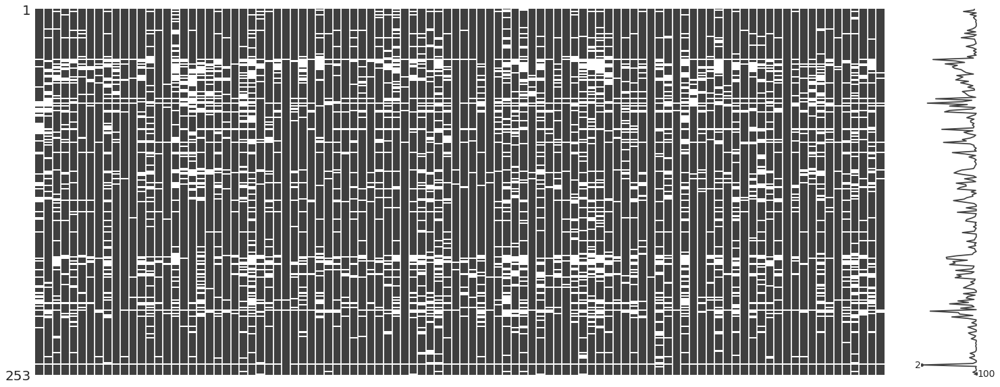

In [11]:
src.plot.missing_data(df_idio_var, save_path='../reports/figures/estimation/matrix_missing.pdf')

In [12]:
print('{:.2f}% of observations missing'.format((df_idio_var.isna()).sum().sum() / len(df_idio_var.stack(dropna=False))*100))

13.52% of observations missing


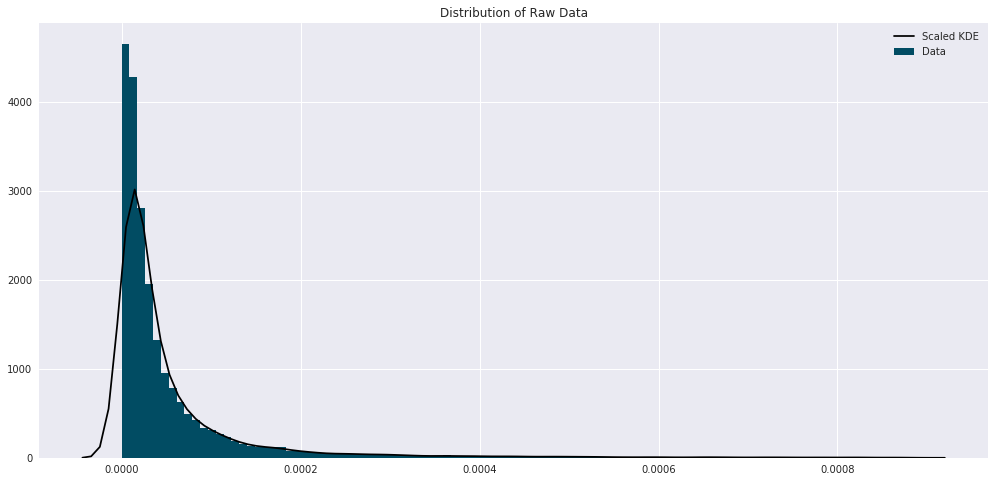

In [13]:
src.plot.histogram(df_idio_var.fillna(0).stack(), title='Distribution of Raw Data', drop_tails=0.01, bins=100,
                          save_path='../reports/figures/estimation/histogram_raw_data.pdf')

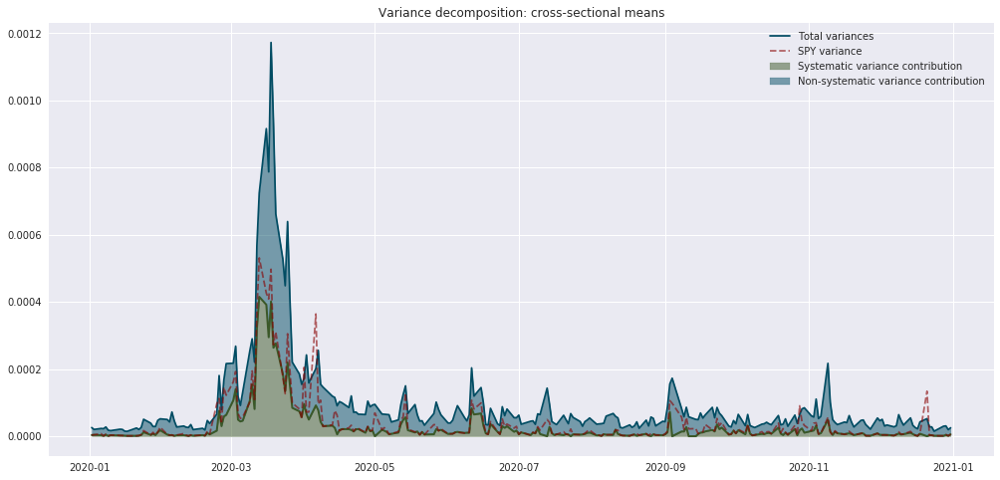

In [14]:
src.plot.var_timeseries(df_idio_var, total_var=df_var, index_var=df_spy_var,
                          save_path='../reports/figures/estimation/variance_decomposition.pdf')

In [15]:
df_log_idio_var = src.utils.log_replace(df_idio_var, method='min')

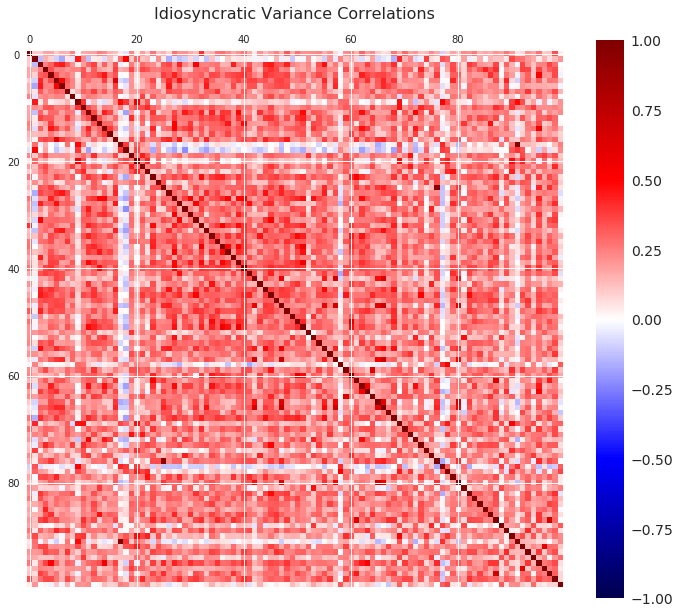

In [16]:
src.plot.corr_heatmap(df_log_idio_var.corr(), title='Idiosyncratic Variance Correlations',
                      save_path='../reports/figures/estimation/heatmap_idiosyncratic_variance_correlation.pdf')

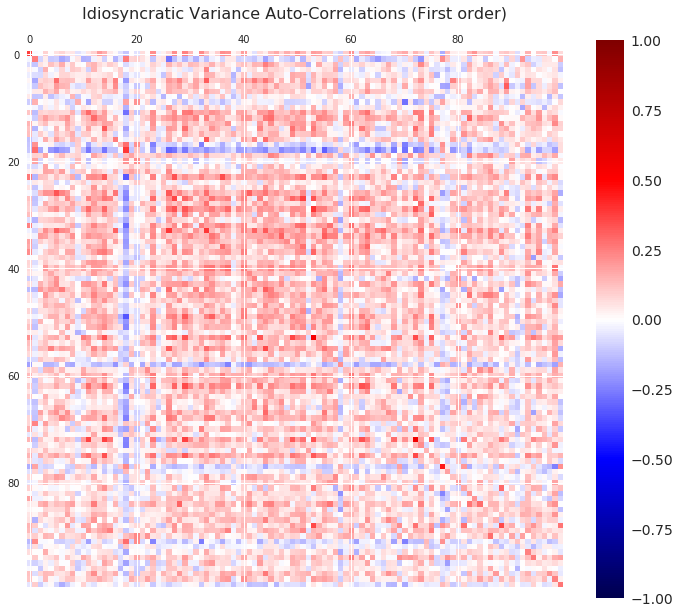

In [17]:
src.plot.corr_heatmap(src.utils.autocorrcoef(df_log_idio_var, lag=1), title='Idiosyncratic Variance Auto-Correlations (First order)',
                         save_path='../reports/figures/estimation/heatmap_idiosyncratic_variance_autocorrelation.pdf')

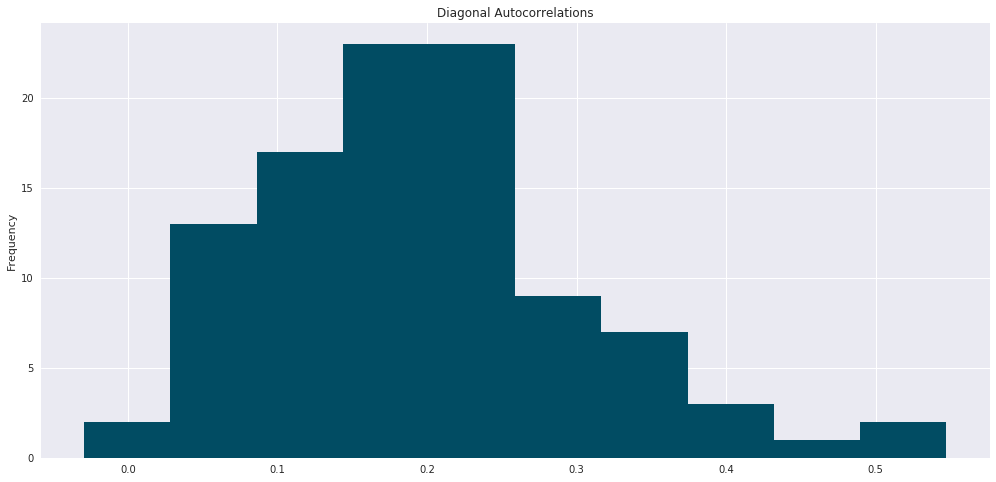

In [18]:
pd.Series(np.diag(src.utils.autocorrcoef(df_log_idio_var, lag=1))).plot(kind='hist', title='Diagonal Autocorrelations', bins=10)
plt.show()

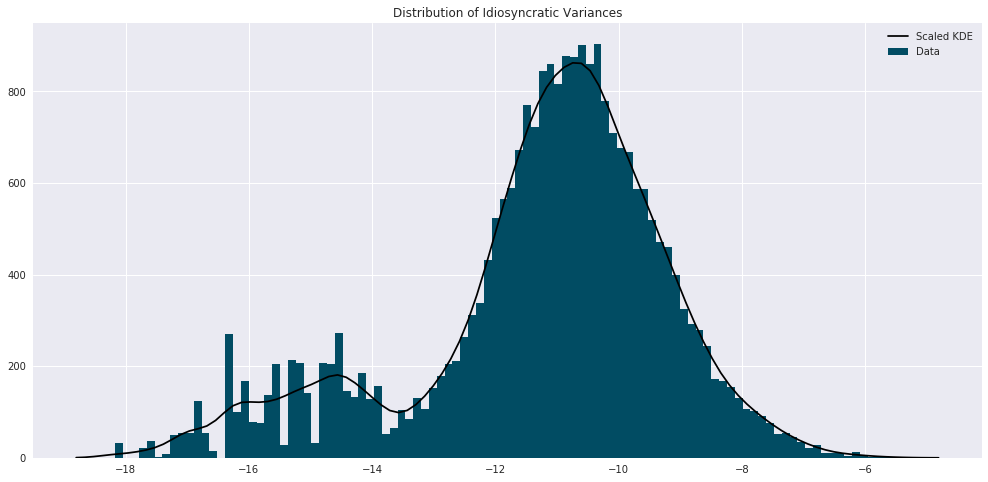

In [19]:
src.plot.histogram(df_log_idio_var.stack(),  title='Distribution of Idiosyncratic Variances',
                       save_path='../reports/figures/estimation/histogram_idiosyncratic_variance.pdf')

## VAR estimation

$r_{i,t} = \alpha_i + \sum_{k=1}^{K} \beta_{i,k} f_{k,t} + \sum_{j=1}^{N} \gamma_{i,j} r_{j,t-1}  + u_{i,t}$

where
- $r_{i,t}$: $1 \times 1$ (asset excess returns)
- $\alpha_i$: $1 \times 1$ (intercepts/pricing errors)
- $f_{k,t}$: $1 \times 1$ (factor excess returns)
- $\beta_{i,k}$: $1 \times 1$ (factor loadings)
- $\gamma_{i,j}$: $1 \times 1$ (VAR coefficients)
- $u_{i,t}$: $1 \times 1$ (error term)

Adaptive Elastic Net with hyperparameters $\lambda, \kappa$

$(\hat{\alpha}, \hat{\beta}, \hat{\gamma})= \underset{(\alpha, \beta, \gamma)}{argmin} \Bigg[ \frac{1}{2NT}\sum_{i=1}^{N}\sum_{t=1}^{T} \Big(r_{i,t} - \big(\alpha_i + \sum_{k=1}^{K} \beta_{i,k} f_{k,t} + \sum_{j=1}^{N} \gamma_{i,j} r_{j,t-1}\big)\Big)^2 + \lambda \sum_{i=1}^{N}\sum_{j=1}^{N} w_{i,j} \big(\kappa |\gamma_{i,j}| + (1-\kappa) \frac{1}{2} \gamma_{i,j}^2\big)\Bigg]$

weights are set to $w_{i,j} =|\hat{\beta}_{i,j,OLS}|^{-1}$

In [20]:
var = src.VAR(add_intercepts=True, p_lags=1)
var.fit(df_log_idio_var, method='OLS')

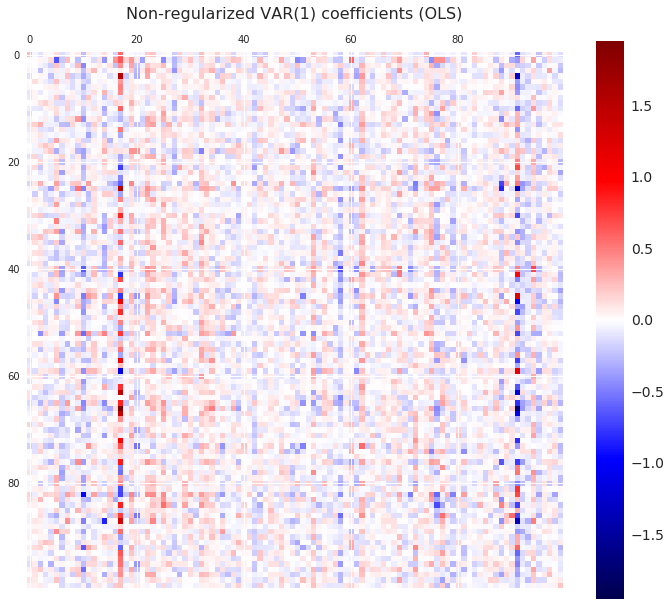

In [21]:
src.plot.corr_heatmap(var.var_1_matrix_, title='Non-regularized VAR(1) coefficients (OLS)', infer_limits=True,
                          save_path='../reports/figures/estimation/heatmap_ols_var1_matrix.pdf')

In [22]:
# for logged data
var_grid = {'alpha': np.geomspace(1e-5, 1e0, 11),
            'lambdau': np.geomspace(1e-2, 1e2, 13),
            #'gamma': np.geomspace(1e-2, 1e2, 15),
            }

In [23]:
%%time
var_cv = var.fit_adaptive_elastic_net_cv(df_log_idio_var, grid=var_grid, return_cv=True)

Updating penalty_weights...
Searching suitable init_lambda hyperparameter...
Fitting 12 folds for each of 143 candidates, totalling 1716 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   15.2s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 1716 out of 1716 | elapsed:  7.8min finished


CPU times: user 14.2 s, sys: 4 s, total: 18.2 s
Wall time: 10min 14s


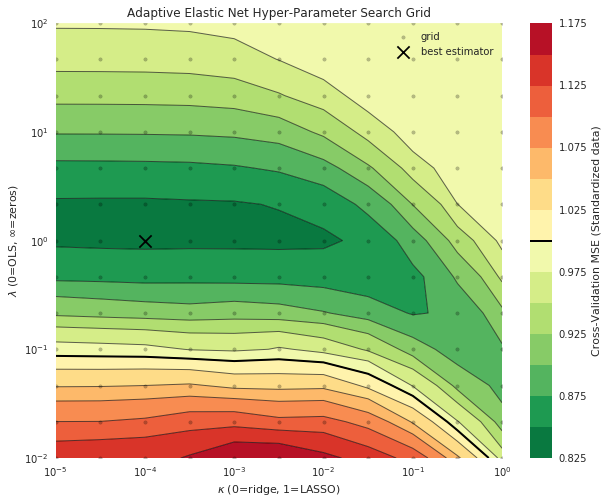

In [24]:
src.plot.net_cv_contour(var_cv, 15, logx=True, logy=True,
                            save_path='../reports/figures/estimation/contour_var.pdf')

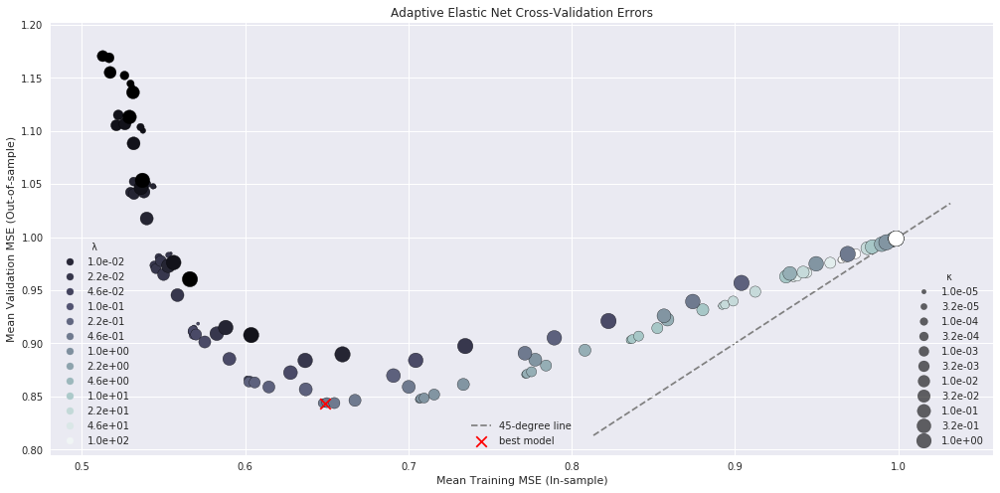

In [25]:
src.plot.net_scatter_losses(var_cv,
                            save_path='../reports/figures/estimation/scatter_var.pdf')

In [26]:
gammas = var.var_1_matrix_
n_series = df_log_idio_var.shape[1]
density = var.var_density_#(gammas!=0).sum()/n_series**2*n_series
κ = var_cv.best_params_['alpha']
λ = var_cv.best_params_['lambdau']
print('VAR(1) matrix is {:.2f}% dense.'.format(density*100))
print('Best hyperparameters are alpha={:.2f}, lambda={:.10f}.'.format(κ, λ))
print('Best hyperparameters are alpha={}, lambda={}.'.format(κ, λ))
print('Average VAR spillover is {:.4f}, absolute {:.4f}'.format(gammas.mean(), abs(gammas).mean()))
try:
    print('Mean factor loading is {:.4f}, with min {:.4f}, max {:.4f}'.format(var.exog_loadings_.mean(), var.exog_loadings_.min(), var.exog_loadings_.max()))
except:
    pass

VAR(1) matrix is 74.42% dense.
Best hyperparameters are alpha=0.00, lambda=1.0000000000.
Best hyperparameters are alpha=0.0001, lambda=1.0.
Average VAR spillover is 0.0021, absolute 0.0234


/home/rubelrennfix/.virtualenvs/euraculus/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice.
  # This is added back by InteractiveShellApp.init_path()
/home/rubelrennfix/.virtualenvs/euraculus/lib/python3.6/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


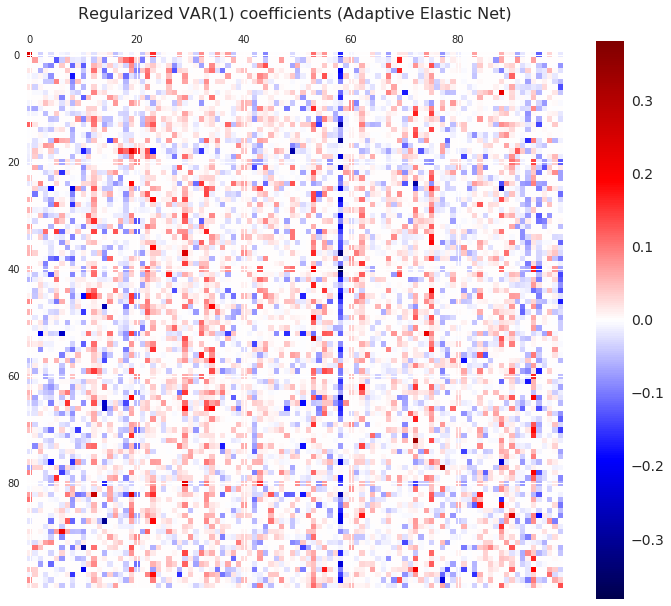

In [27]:
src.plot.corr_heatmap(var.var_1_matrix_, title='Regularized VAR(1) coefficients (Adaptive Elastic Net)', infer_limits=True,
                          save_path='../reports/figures/estimation/heatmap_aenet_var1_matrix.pdf')

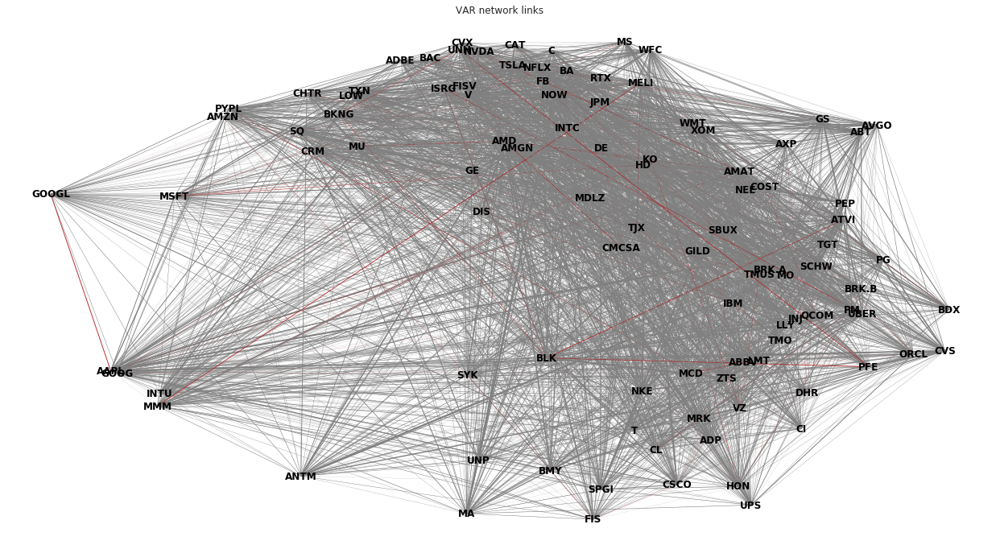

In [28]:
vargraph = nx.convert_matrix.from_numpy_array(var.var_1_matrix_, create_using=nx.DiGraph)
src.plot.network_graph(vargraph, column_to_ticker, linewidth=0.02, red_percent=2, title='VAR network links',
                       save_path='../reports/figures/estimation/network_VAR.png')

In [29]:
residuals = var.residuals(df_log_idio_var)

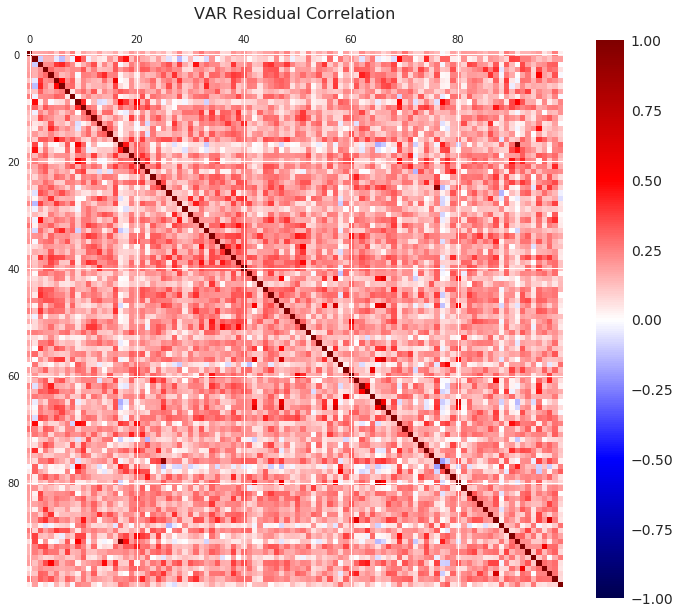

In [30]:
src.plot.corr_heatmap(residuals.corr(), title='VAR Residual Correlation',
                          save_path='../reports/figures/estimation/heatmap_VAR_residual_correlation.pdf')

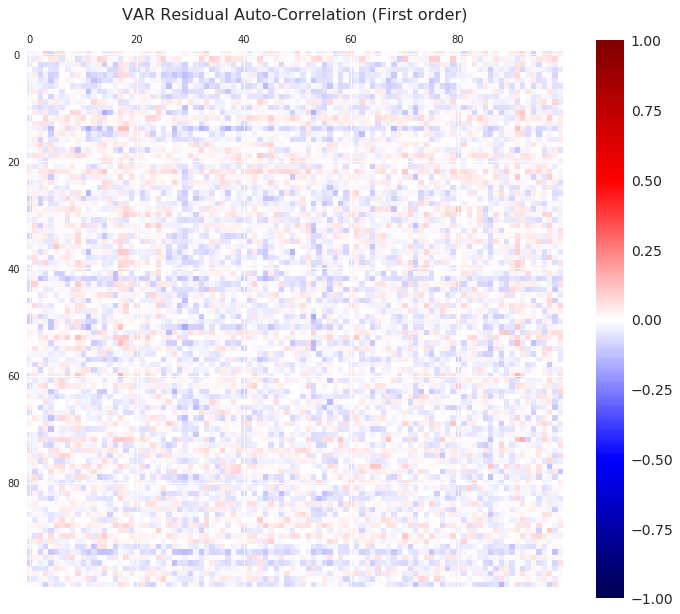

In [31]:
src.plot.corr_heatmap(src.utils.autocorrcoef(residuals, lag=1), title='VAR Residual Auto-Correlation (First order)',
                          save_path='../reports/figures/estimation/heatmap_VAR_residual_autocorrelation.pdf')

### Covariance matrix estimation

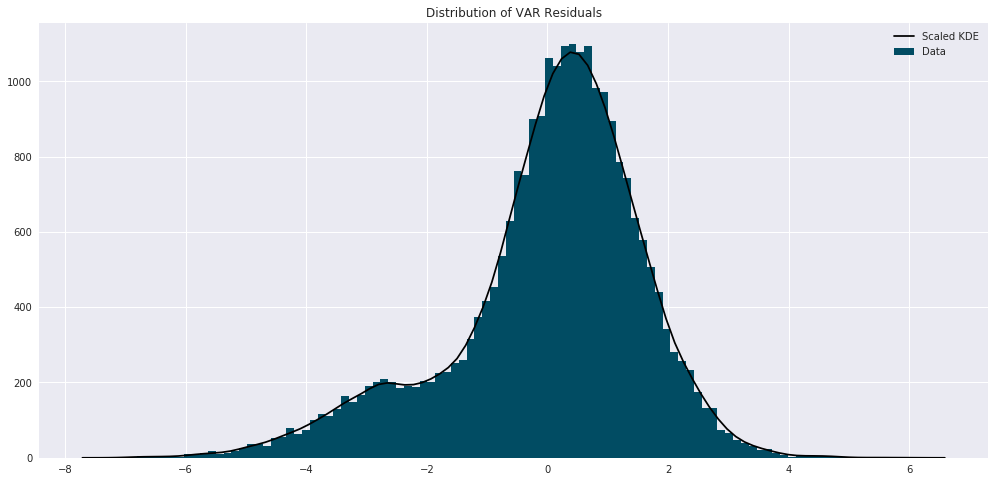

In [32]:
src.plot.histogram(residuals.stack(),  title='Distribution of VAR Residuals',
                       save_path='../reports/figures/estimation/histogram_VAR_residuals.pdf')

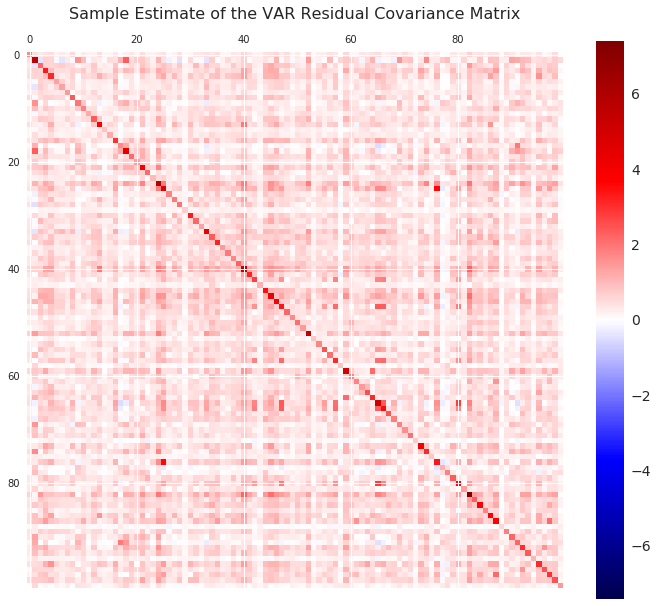

In [33]:
src.plot.corr_heatmap(residuals.cov(), title='Sample Estimate of the VAR Residual Covariance Matrix', infer_limits=True,
                          save_path='../reports/figures/estimation/heatmap_VAR_residual_covariance.pdf')

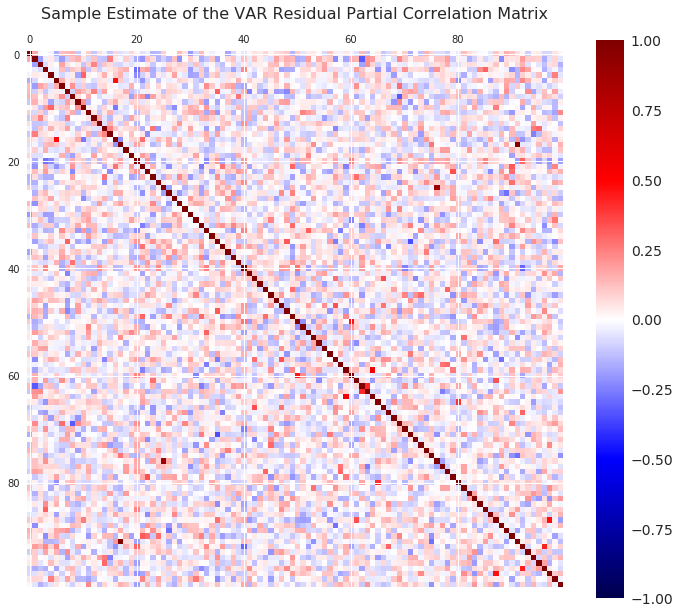

In [34]:
src.plot.corr_heatmap(src.utils.prec_to_pcorr(np.linalg.inv(residuals.cov())),
                      title='Sample Estimate of the VAR Residual Partial Correlation Matrix',
                      save_path='../reports/figures/estimation/heatmap_VAR_residual_partial_corr.pdf')

#### Adaptive Threshold Estimation

In [35]:
ate = src.covar.AdaptiveThresholdEstimator()

In [36]:
cov_grid = {'delta': np.geomspace(0.5, 1, 11),
            'eta': np.linspace(0, 2, 13)}

In [37]:
%%time
cov_cv = GridSearchCV(ate, cov_grid, cv=12, n_jobs=-1, verbose=1, return_train_score=True).fit(residuals)
covar_ate = cov_cv.best_estimator_.covariance_

Fitting 12 folds for each of 143 candidates, totalling 1716 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   32.8s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  3.6min


CPU times: user 8.88 s, sys: 531 ms, total: 9.41 s
Wall time: 4min 58s


[Parallel(n_jobs=-1)]: Done 1716 out of 1716 | elapsed:  5.0min finished


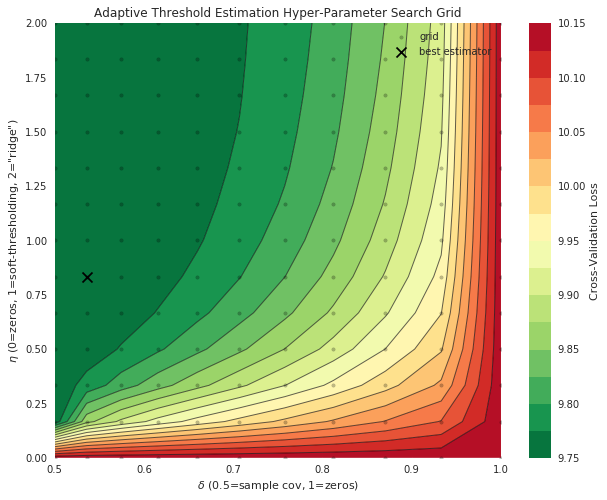

In [38]:
src.plot.cov_cv_contour(cov_cv, 15, logx=False, logy=False,
                           save_path='../reports/figures/estimation/contour_cov.pdf')

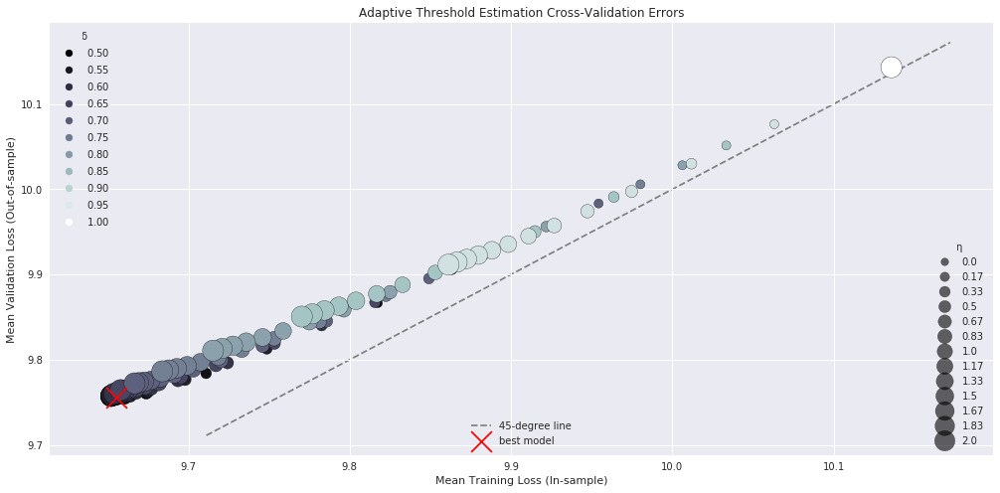

In [39]:
src.plot.cov_scatter_losses(cov_cv,
                            save_path='../reports/figures/estimation/scatter_cov.pdf')

In [40]:
density = (covar_ate!=0).sum()/covar_ate.size*100
δ = cov_cv.best_params_['delta']
η = cov_cv.best_params_['eta']
print('covariance matrix is {:.2f}% dense.'.format(density))
print('Best hyperparameters are delta={:.2f}, eta={:.10f}.'.format(δ, η))
print('Values were shrunk by {:.2f}% on average.'.format((1-(covar_ate/np.cov(residuals, rowvar=False)).mean())*100))

covariance matrix is 97.36% dense.
Best hyperparameters are delta=0.54, eta=0.8333333333.
Values were shrunk by 18.51% on average.


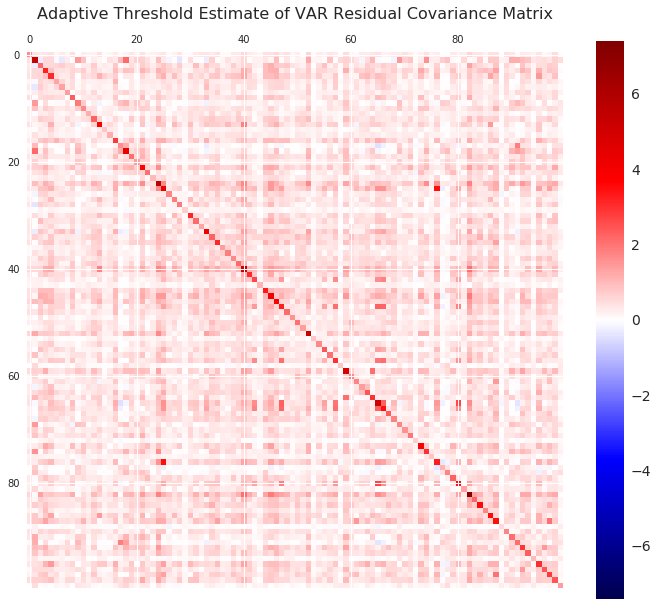

In [41]:
lim = residuals.cov().abs().values.max()
src.plot.corr_heatmap(covar_ate, title='Adaptive Threshold Estimate of VAR Residual Covariance Matrix',
                          vmin=-lim, vmax=lim,
                          save_path='../reports/figures/estimation/heatmap_cov_matrix_ate.pdf')

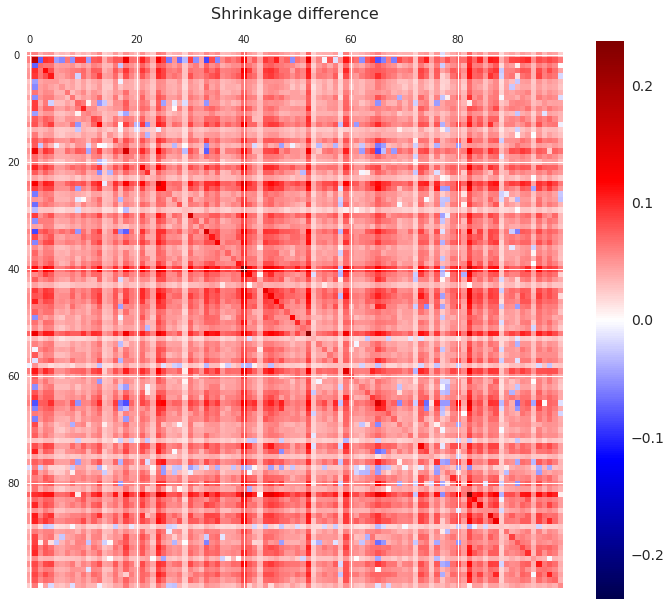

In [42]:
src.plot.corr_heatmap(residuals.cov().values - covar_ate, 'Shrinkage difference', infer_limits=True)

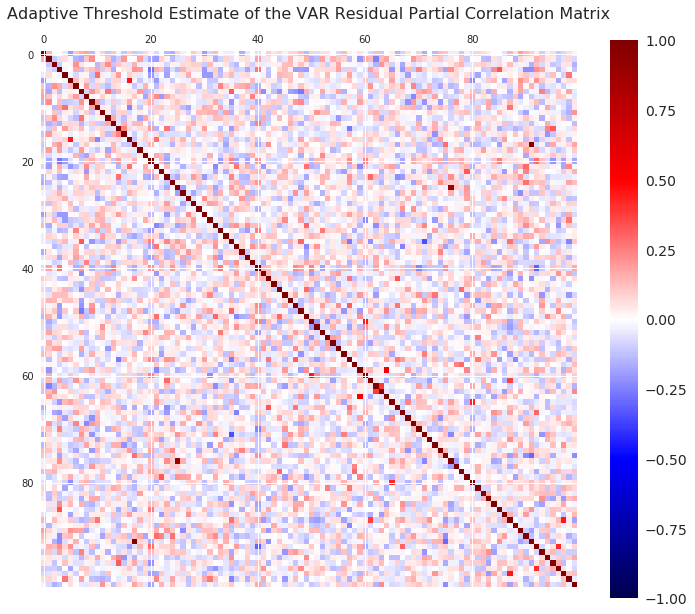

In [43]:
src.plot.corr_heatmap(src.utils.prec_to_pcorr(np.linalg.inv(covar_ate)), 
                      title='Adaptive Threshold Estimate of the VAR Residual Partial Correlation Matrix')

#### GLASSO

In [44]:
glasso = src.covar.GLASSO()
glasso_grid = {'alpha': np.geomspace(1e-2, 1e0, 25)}

In [45]:
%%time
glasso_cv = GridSearchCV(glasso, glasso_grid, cv=12, n_jobs=-1, verbose=1, return_train_score=True).fit(residuals)
covar = glasso_cv.best_estimator_.covariance_

Fitting 12 folds for each of 25 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  4.4min finished


CPU times: user 10.6 s, sys: 3.77 s, total: 14.4 s
Wall time: 4min 29s


/home/rubelrennfix/.virtualenvs/euraculus/lib/python3.6/site-packages/sklearn/covariance/_graph_lasso.py:266: ConvergenceWarning: graphical_lasso: did not converge after 100 iteration: dual gap: -5.426e-03
  % (max_iter, d_gap), ConvergenceWarning)


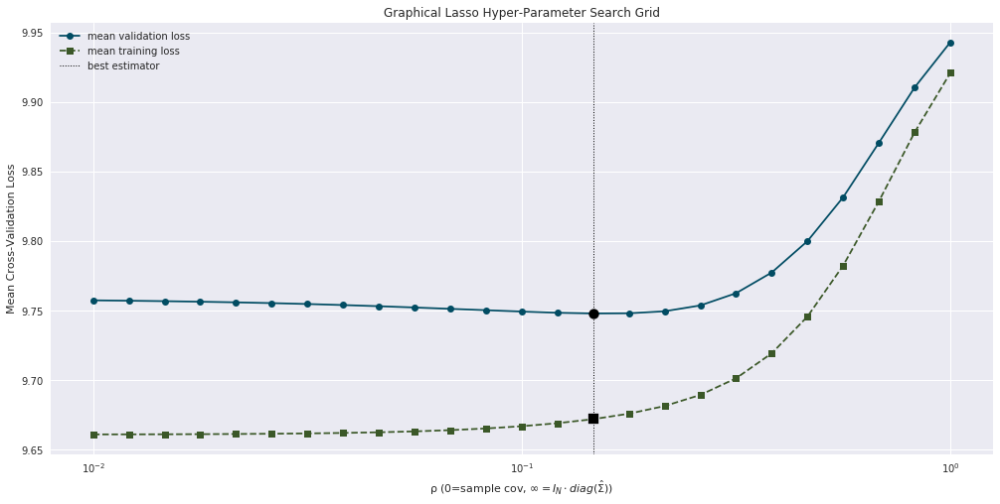

In [46]:
src.plot.plot_glasso_cv(glasso_cv,
                        save_path='../reports/figures/estimation/line_cov_cv.pdf')

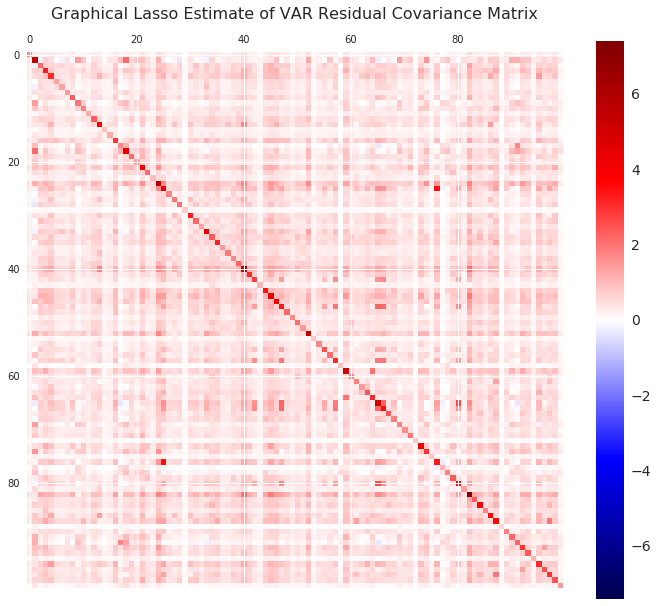

In [47]:
lim = residuals.cov().abs().values.max()
src.plot.corr_heatmap(covar, title='Graphical Lasso Estimate of VAR Residual Covariance Matrix',
                          vmin=-lim, vmax=lim,
                          save_path='../reports/figures/estimation/heatmap_cov_matrix.pdf')

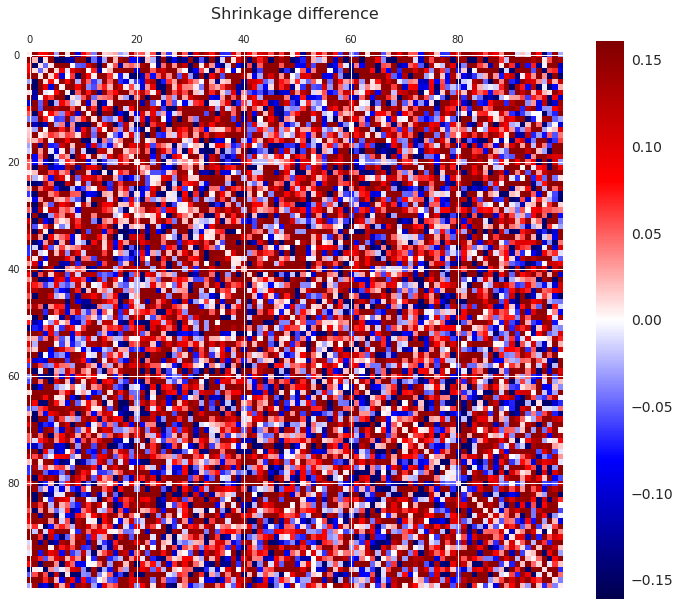

In [48]:
src.plot.corr_heatmap(residuals.cov().values - covar, 'Shrinkage difference', infer_limits=True)

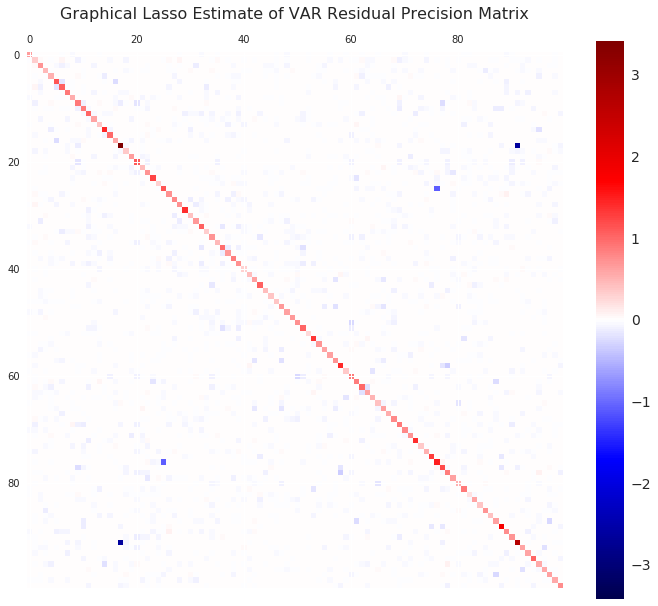

In [49]:
src.plot.corr_heatmap(glasso_cv.best_estimator_.precision_, infer_limits=True,
                      title='Graphical Lasso Estimate of VAR Residual Precision Matrix')

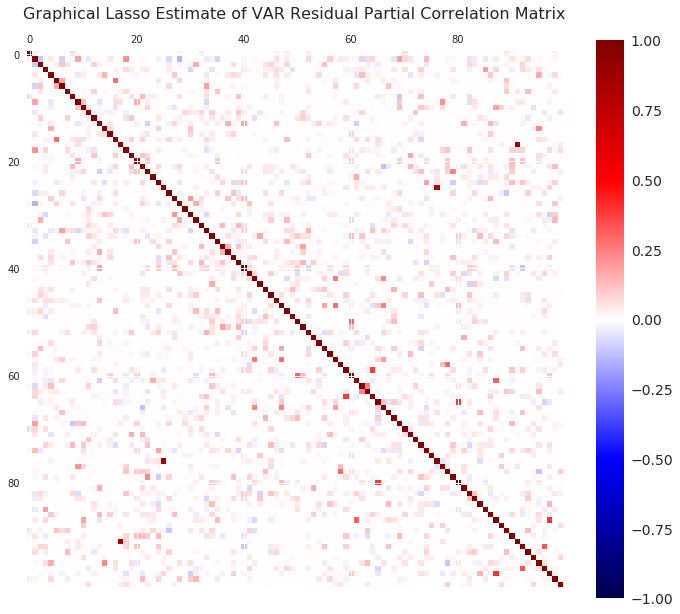

In [50]:
src.plot.corr_heatmap(src.utils.prec_to_pcorr(glasso_cv.best_estimator_.precision_),
                      title='Graphical Lasso Estimate of VAR Residual Partial Correlation Matrix',
                      save_path='../reports/figures/estimation/heatmap_partial_corr_matrix.pdf')

In [95]:
glasso_cv.best_estimator_.precision_density_

0.319

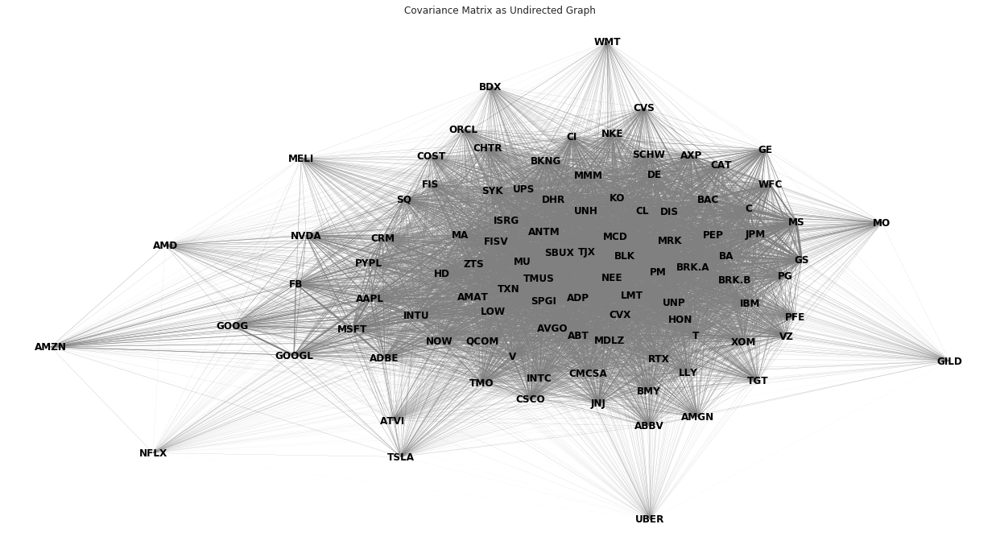

In [51]:
covgraph = nx.convert_matrix.from_numpy_array(glasso_cv.best_estimator_.covariance_, create_using=nx.Graph)
src.plot.network_graph(covgraph, column_to_ticker, linewidth=0.5, red_percent=0, title='Covariance Matrix as Undirected Graph')

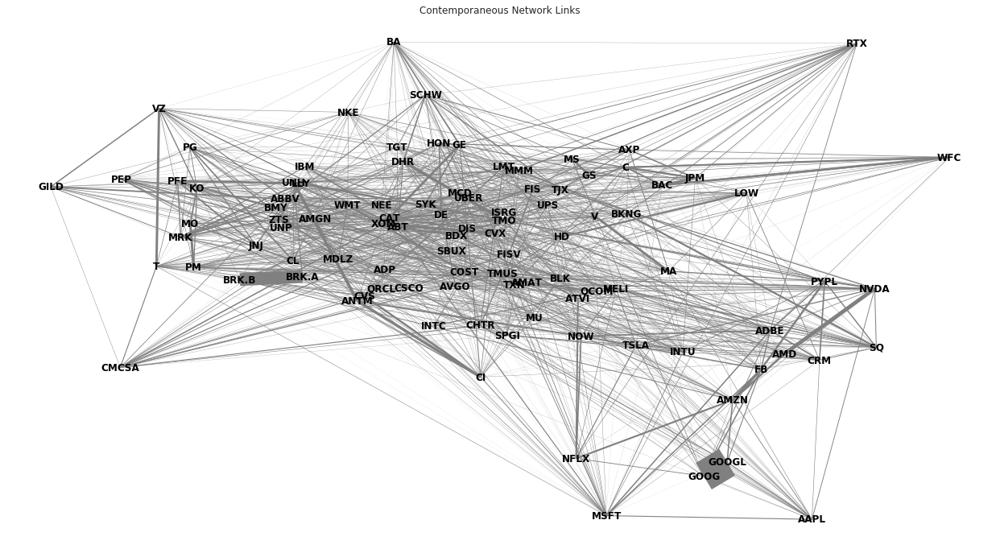

In [52]:
congraph = nx.convert_matrix.from_numpy_array(-glasso_cv.best_estimator_.precision_+2*np.diag(np.diag(glasso_cv.best_estimator_.precision_)), create_using=nx.Graph)
src.plot.network_graph(congraph, column_to_ticker, linewidth=1, red_percent=0, title='Contemporaneous Network Links',
                       save_path='../reports/figures/estimation/network_glasso.png')

### FEVD

In [53]:
horizon = 21
fevd = src.FEVD(var.var_1_matrix_, covar)

In [54]:
lim = abs(fevd.vma_matrix(1)).max()

#### VMA Matrices

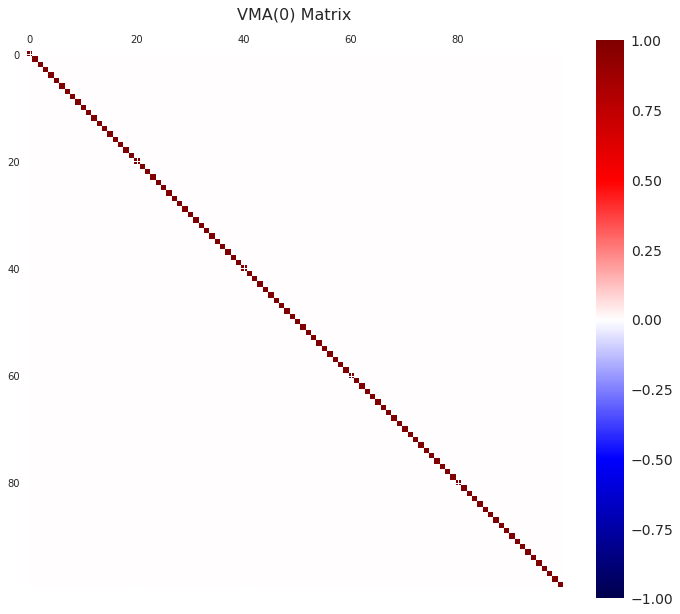

In [55]:
src.plot.corr_heatmap(fevd.vma_matrix(0), title='VMA(0) Matrix', infer_limits=True, #, vmin=-lim, vmax=lim,
                      save_path='../reports/figures/estimation/heatmap_vma0_matrix.pdf')

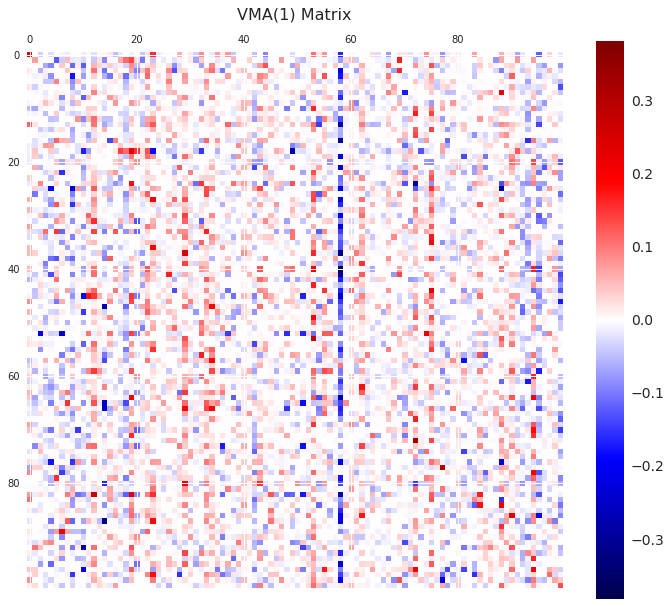

In [56]:
src.plot.corr_heatmap(fevd.vma_matrix(1), title='VMA(1) Matrix', infer_limits=True, #, vmin=-lim, vmax=lim,
                      save_path='../reports/figures/estimation/heatmap_vma1_matrix.pdf')

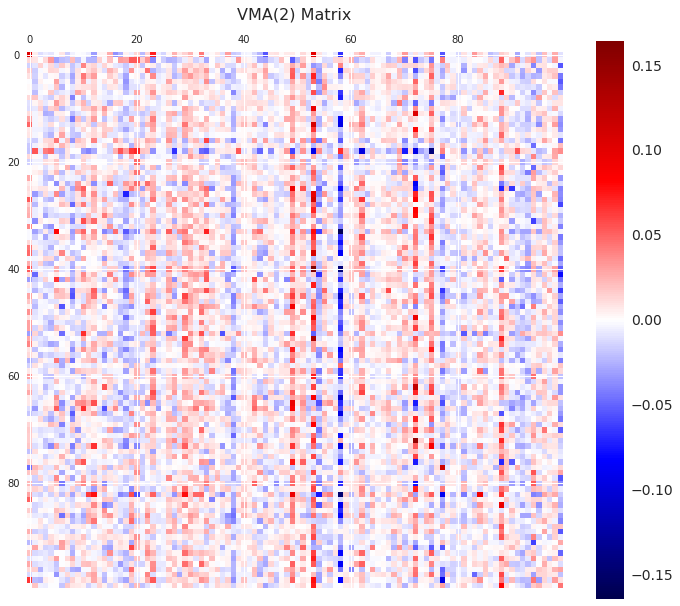

In [57]:
src.plot.corr_heatmap(fevd.vma_matrix(2), title='VMA(2) Matrix', infer_limits=True, #, vmin=-lim, vmax=lim,
                      save_path='../reports/figures/estimation/heatmap_vma2_matrix.pdf')

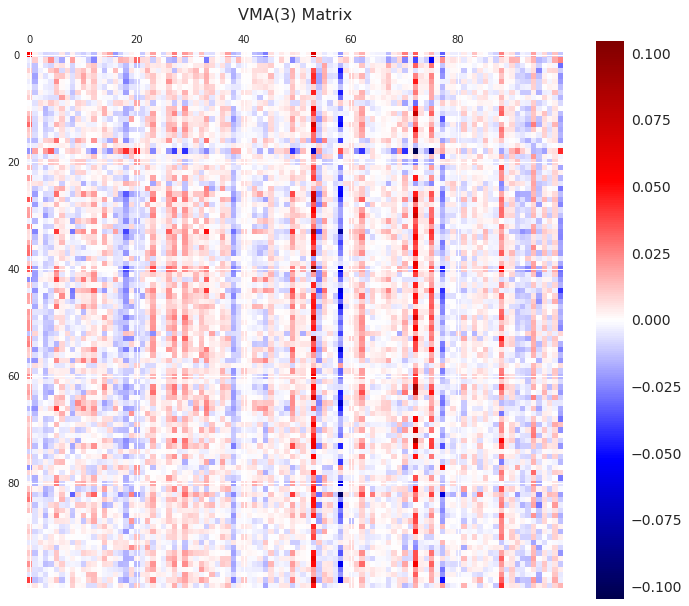

In [58]:
src.plot.corr_heatmap(fevd.vma_matrix(3), title='VMA(3) Matrix', infer_limits=True, #, vmin=-lim, vmax=lim,
                      save_path='../reports/figures/estimation/heatmap_vma3_matrix.pdf')

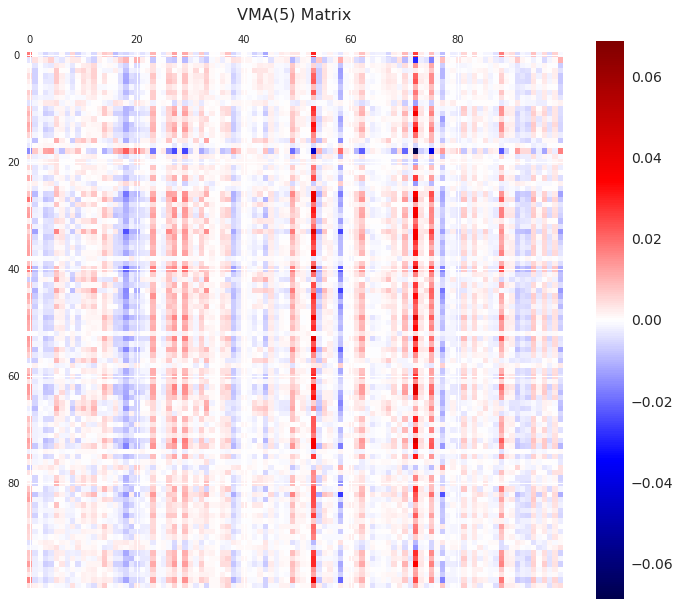

In [59]:
src.plot.corr_heatmap(fevd.vma_matrix(5), title='VMA(5) Matrix', infer_limits=True, #, vmin=-lim, vmax=lim,
                      save_path='../reports/figures/estimation/heatmap_vma5_matrix.pdf')

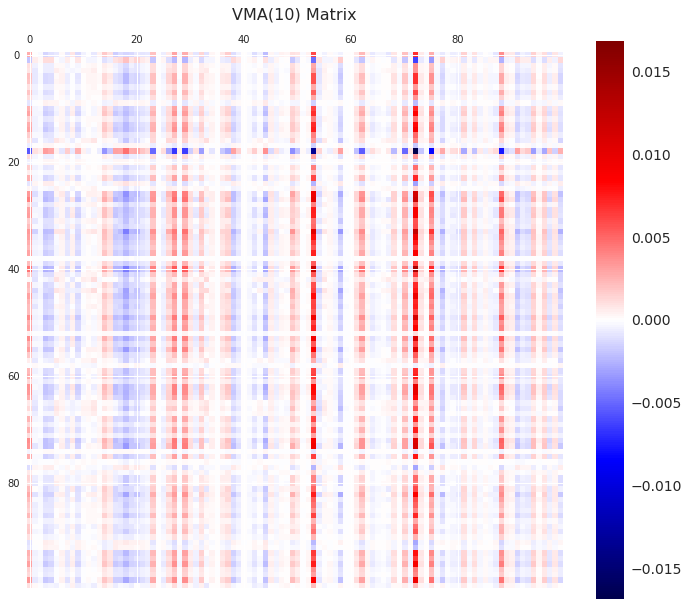

In [60]:
src.plot.corr_heatmap(fevd.vma_matrix(10), title='VMA(10) Matrix', infer_limits=True, #, vmin=-lim, vmax=lim,
                      save_path='../reports/figures/estimation/heatmap_vma10_matrix.pdf')

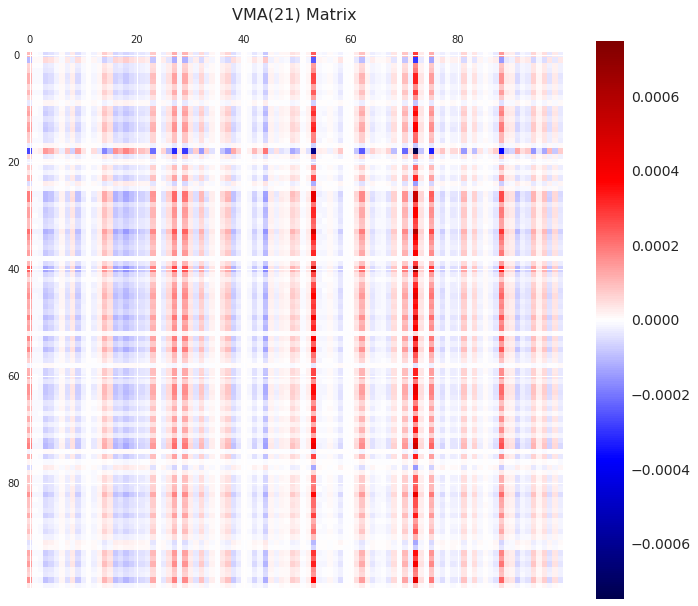

In [61]:
src.plot.corr_heatmap(fevd.vma_matrix(21), title='VMA(21) Matrix', infer_limits=True, #, vmin=-lim, vmax=lim,
                      save_path='../reports/figures/estimation/heatmap_vma21_matrix.pdf')

#### Impulse Response Matrices

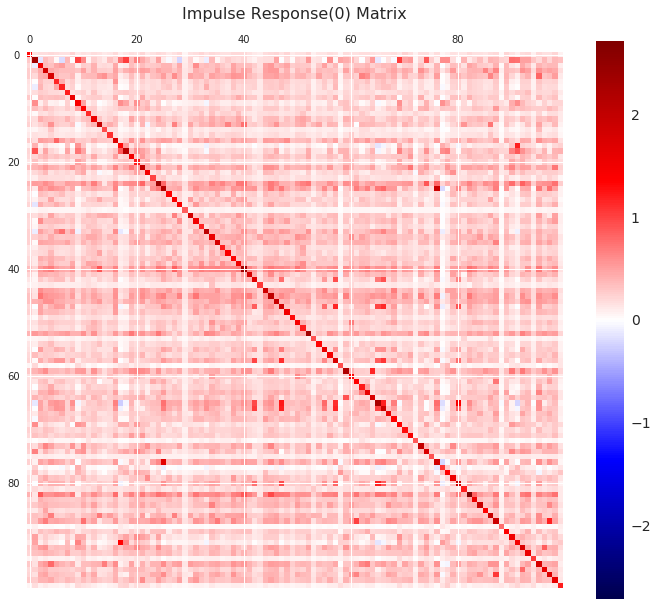

In [62]:
src.plot.corr_heatmap(fevd.impulse_response(0), title='Impulse Response(0) Matrix', infer_limits=True,
                      save_path='../reports/figures/estimation/heatmap_ir0_matrix.pdf')

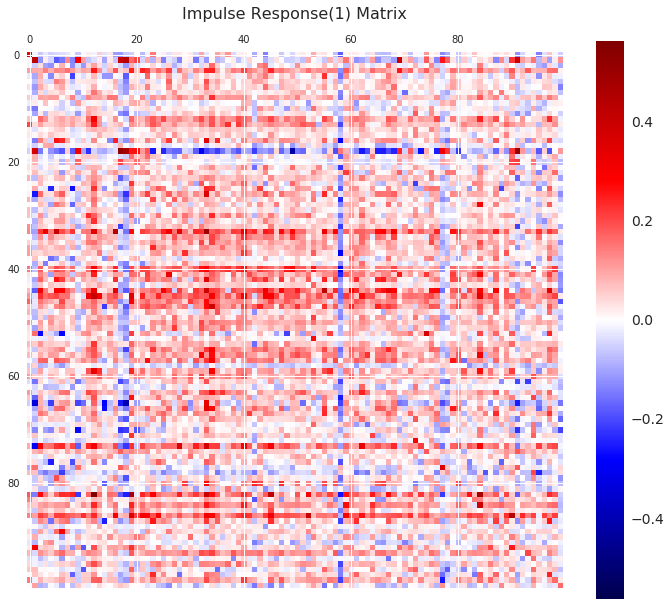

In [63]:
src.plot.corr_heatmap(fevd.impulse_response(1), title='Impulse Response(1) Matrix', infer_limits=True,
                      save_path='../reports/figures/estimation/heatmap_ir1_matrix.pdf')

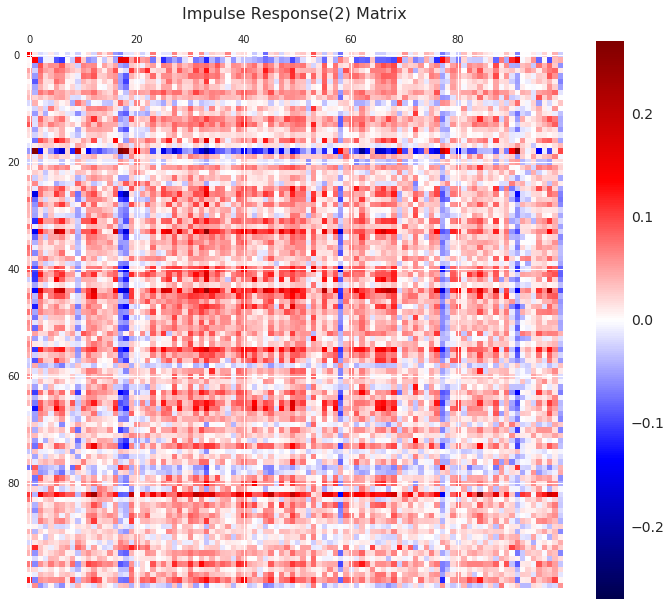

In [64]:
src.plot.corr_heatmap(fevd.impulse_response(2), title='Impulse Response(2) Matrix', infer_limits=True,
                      save_path='../reports/figures/estimation/heatmap_ir2_matrix.pdf')

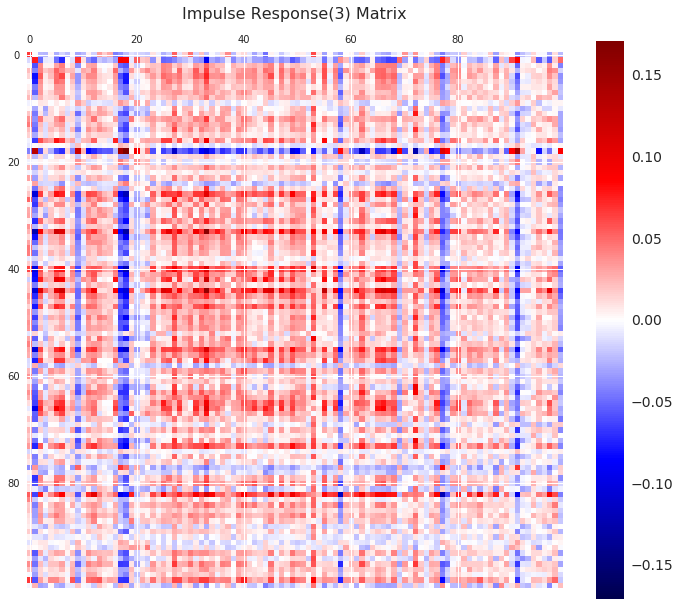

In [65]:
src.plot.corr_heatmap(fevd.impulse_response(3), title='Impulse Response(3) Matrix', infer_limits=True,
                      save_path='../reports/figures/estimation/heatmap_ir3_matrix.pdf')

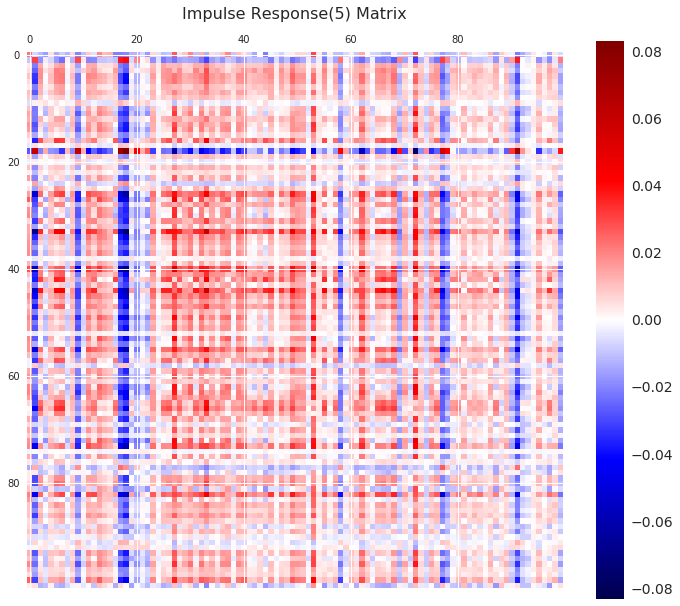

In [66]:
src.plot.corr_heatmap(fevd.impulse_response(5), title='Impulse Response(5) Matrix', infer_limits=True,
                      save_path='../reports/figures/estimation/heatmap_ir5_matrix.pdf')

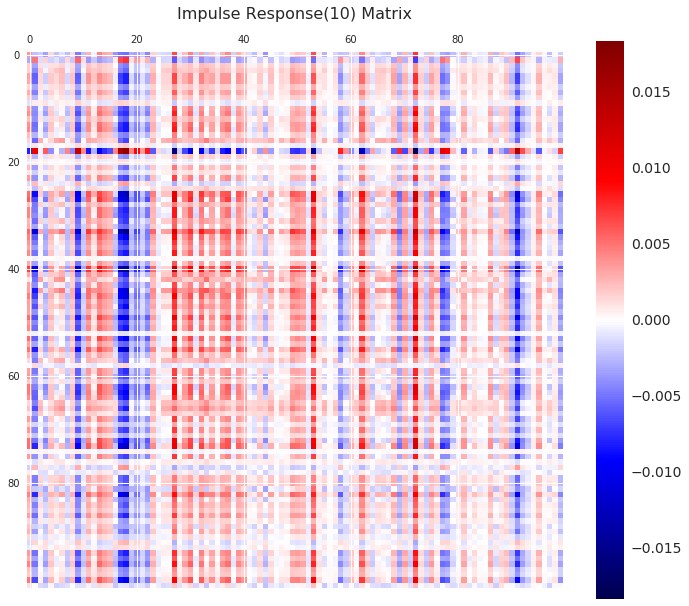

In [67]:
src.plot.corr_heatmap(fevd.impulse_response(10), title='Impulse Response(10) Matrix', infer_limits=True,
                      save_path='../reports/figures/estimation/heatmap_ir10_matrix.pdf')

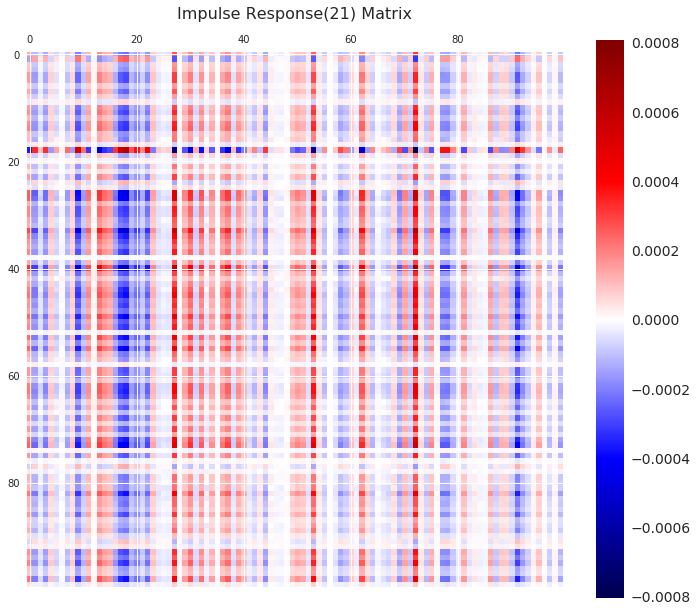

In [68]:
src.plot.corr_heatmap(fevd.impulse_response(21), title='Impulse Response(21) Matrix', infer_limits=True,
                      save_path='../reports/figures/estimation/heatmap_ir21_matrix.pdf')

#### FEV Adjacency

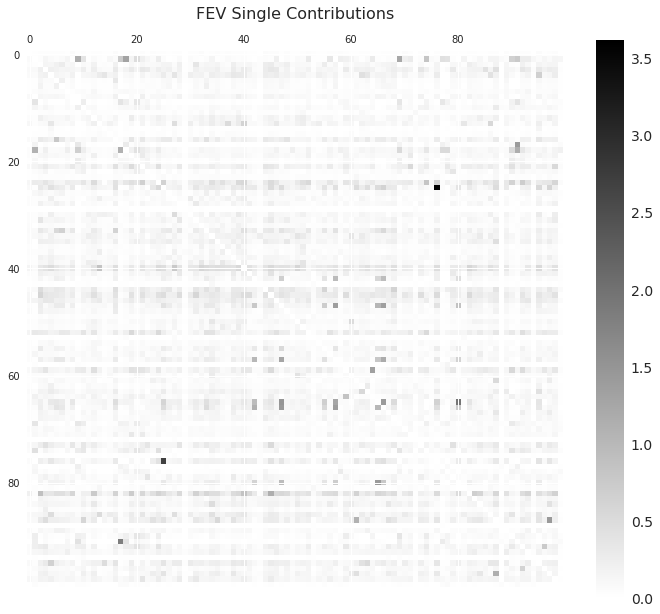

In [69]:
src.plot.corr_heatmap(pd.DataFrame(fevd.fev_single(horizon))-np.diag(np.diag(fevd.fev_single(horizon))),
                      title='FEV Single Contributions', vmin=0, cmap='binary', infer_vmax=True,
                      save_path='../reports/figures/estimation/heatmap_FEV_contributions.pdf')

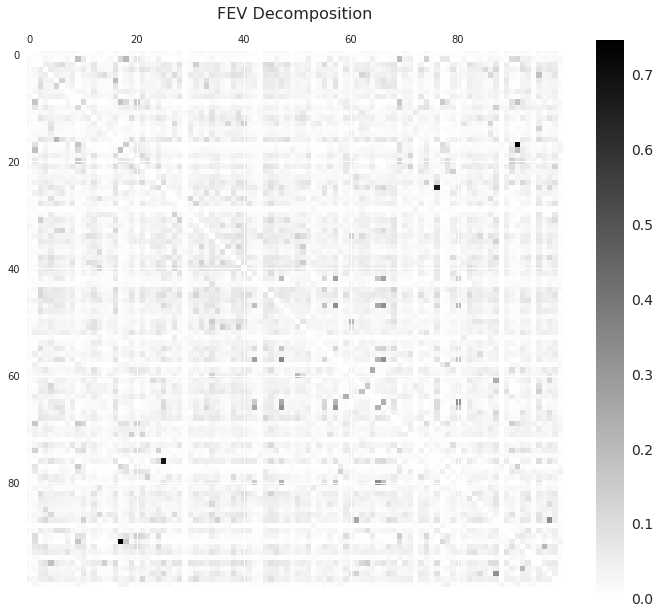

In [70]:
src.plot.corr_heatmap(pd.DataFrame(fevd.decompose_fev(horizon=horizon, normalise=False))-np.diag(np.diag(fevd.decompose_fev(horizon=horizon, normalise=False))),
                      title='FEV Decomposition', vmin=0, vmax=None, cmap='binary',
                      save_path='../reports/figures/estimation/heatmap_FEV_decomposition.pdf')

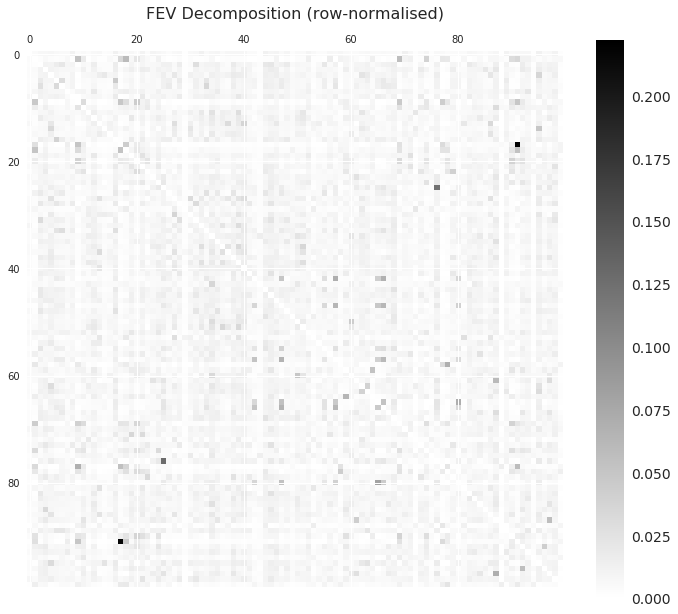

In [71]:
src.plot.corr_heatmap(pd.DataFrame(fevd.decompose_fev(horizon=horizon, normalise=True))-np.diag(np.diag(fevd.decompose_fev(horizon=horizon, normalise=True))),
                      title='FEV Decomposition (row-normalised)', vmin=0, vmax=None, cmap='binary',
                      save_path='../reports/figures/estimation/heatmap_FEV_decomposition_normalised.pdf')

#### FU Adjacency

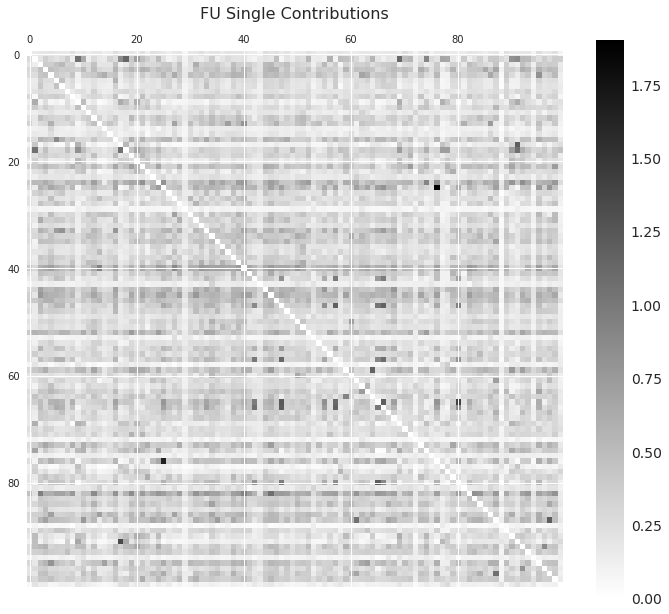

In [72]:
src.plot.corr_heatmap(pd.DataFrame(fevd.fu_single(horizon))-np.diag(np.diag(fevd.fu_single(horizon))),
                      title='FU Single Contributions', vmin=0, cmap='binary', infer_vmax=True,
                      save_path='../reports/figures/estimation/heatmap_FU_contributions.pdf')

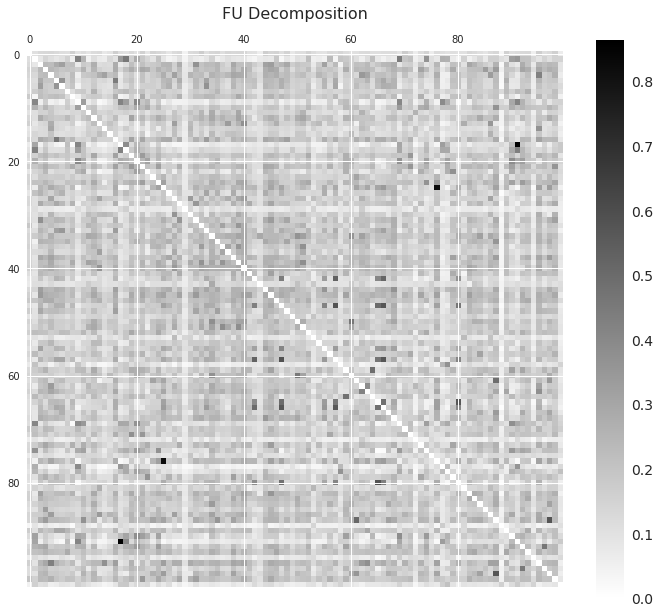

In [73]:
src.plot.corr_heatmap(pd.DataFrame(fevd.decompose_fu(horizon=horizon, normalise=False))-np.diag(np.diag(fevd.decompose_fu(horizon=horizon, normalise=False))),
                      title='FU Decomposition', vmin=0, vmax=None, cmap='binary',
                      save_path='../reports/figures/estimation/heatmap_FU_decomposition.pdf')

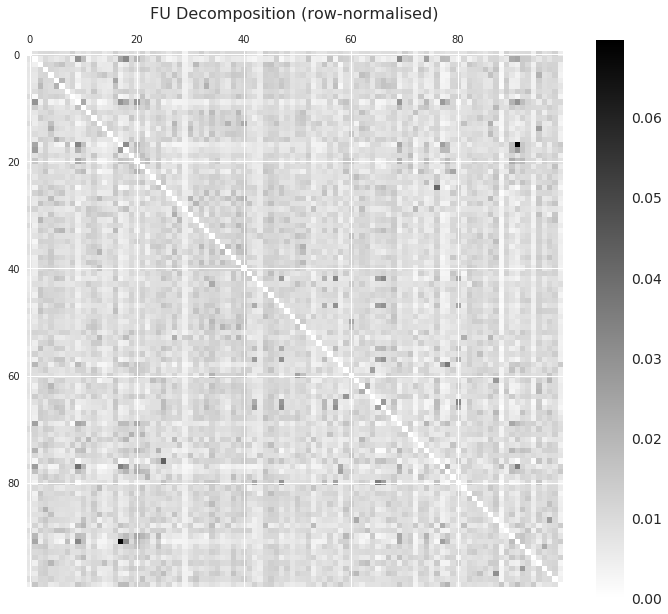

In [74]:
src.plot.corr_heatmap(pd.DataFrame(fevd.decompose_fu(horizon=horizon, normalise=True))-np.diag(np.diag(fevd.decompose_fu(horizon=horizon, normalise=True))),
                      title='FU Decomposition (row-normalised)', vmin=0, vmax=None, cmap='binary',
                      save_path='../reports/figures/estimation/heatmap_FU_decomposition_normalised.pdf')

### Network structure

#### FEV Adjacency

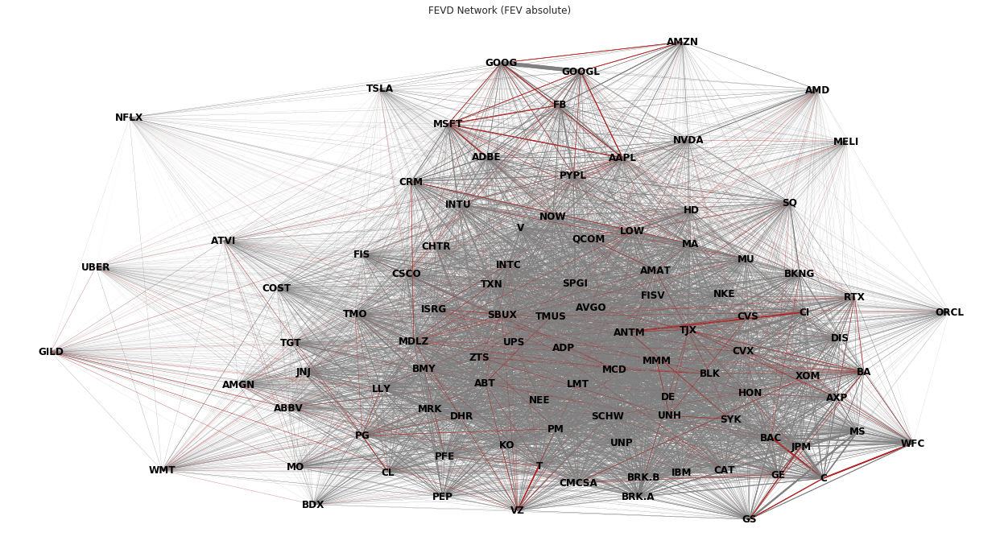

In [75]:
src.plot.network_graph(fevd.to_fev_graph(horizon, normalise=False), column_to_ticker, title='FEVD Network (FEV absolute)', red_percent=5, linewidth=0.25,
                       save_path='../reports/figures/estimation/network_FEV_absolute.png')

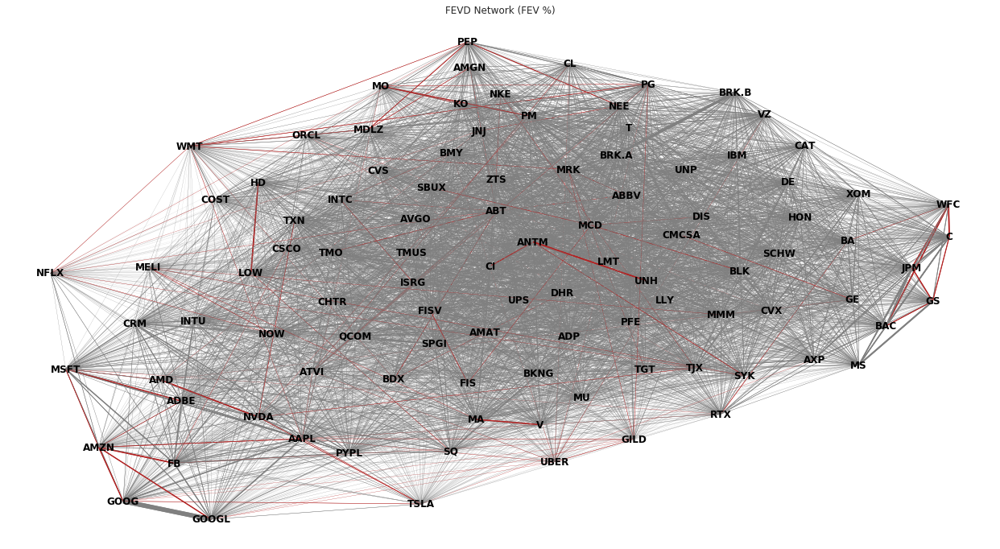

In [79]:
src.plot.network_graph(fevd.to_fev_graph(horizon, normalise=True), column_to_ticker, title='FEVD Network (FEV %)', red_percent=2, linewidth=0.25,
                       save_path='../reports/figures/estimation/network_FEV_normalised.png')

In [88]:
src.utils.lookup_ticker('BLK', year)

permno                    87267
comnam            BLACKROCK INC
namedt      2019-11-20 00:00:00
nameendt    2020-12-31 00:00:00
exchcd                        1
Name: BLK, dtype: object

#### FU Adjacency

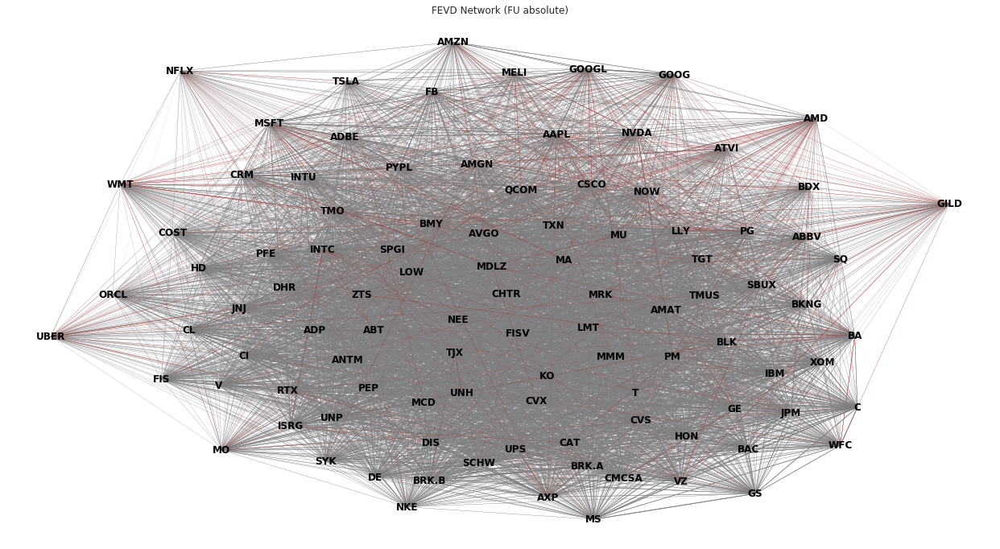

In [77]:
src.plot.network_graph(fevd.to_fu_graph(horizon, normalise=False), column_to_ticker, title='FEVD Network (FU absolute)', red_percent=5, linewidth=0.25,
                       save_path='../reports/figures/estimation/network_FU_absolute.png')

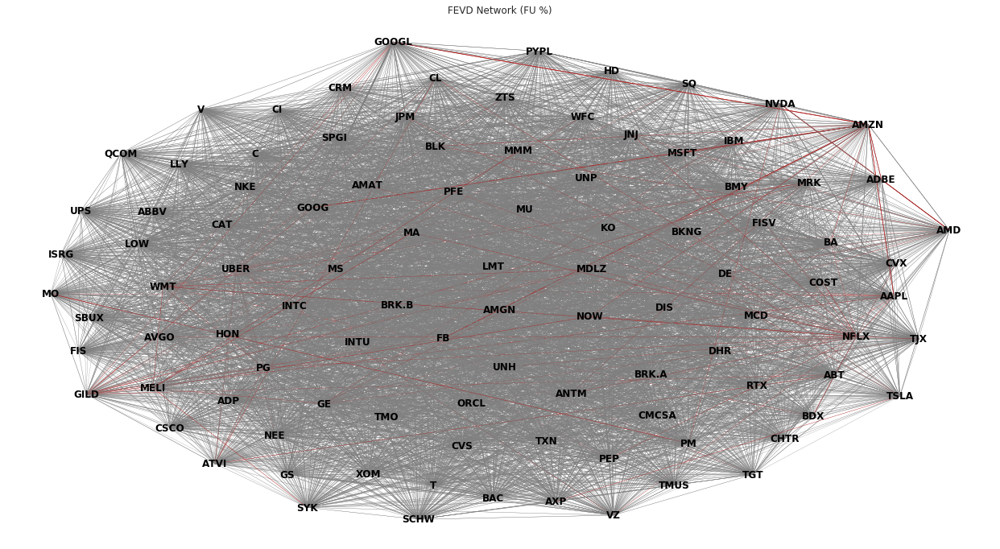

In [78]:
src.plot.network_graph(fevd.to_fu_graph(horizon, normalise=True), column_to_ticker, title='FEVD Network (FU %)', red_percent=2, linewidth=0.25,
                       save_path='../reports/figures/estimation/network_FU_normalised.png')

In [72]:
# lookup single ticker
src.utils.lookup_ticker('TFC', year)#.iloc[-1, :]

permno                      71563
comnam      TRUIST FINANCIAL CORP
namedt        2019-12-09 00:00:00
nameendt      2019-12-31 00:00:00
exchcd                          1
Name: TFC, dtype: object

## Ticker Table

In [323]:
def make_ticker_table(ticker_list):
    ticker_table = kf.FinancialSeries(dtype='object', name='Company Name', index=pd.Index(data=[], name='Ticker'))
    for ticker in ticker_list:
        if ticker in ['BRK.A', 'BRK.B']:
            data = src.utils.lookup_ticker('BRK', year)
        else:
            data = src.utils.lookup_ticker(ticker, year)
        if isinstance(data, pd.DataFrame):
            data = data.iloc[-1, :]
        ticker_table[ticker] = data['comnam'].replace('&', '\&').title()
    ticker_table = ticker_table.to_frame().sort_index()
    return ticker_table

In [327]:
ticker_table = make_ticker_table(ticker_list)
ticker_table.export_to_latex(filename='tickers.tex', path='../reports/tables/')

../../kungfu/kungfu/frame.py:116: UserWarning: Writing to LaTeX format using pandas method. Consider            using kungfu method export_to_latex for preset formatiing
  using kungfu method export_to_latex for preset formatiing')


## TRIALS: Correlation Elastic Net

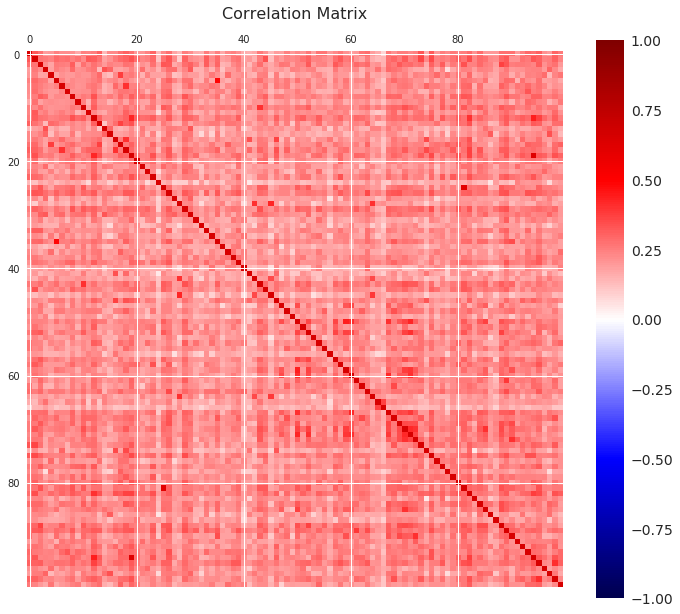

In [247]:
from sklearn.linear_model import LinearRegression
from src.net import ElasticNet
_ = src.covar.CorrelationNet()
_.fit_elastic_net(df_volas, return_model=False, lambdau=5e-5, alpha=0)
#_.fit_OLS(df_volas, return_model=False)
src.plot.corr_heatmap(_.coef_.reshape(100,-1))

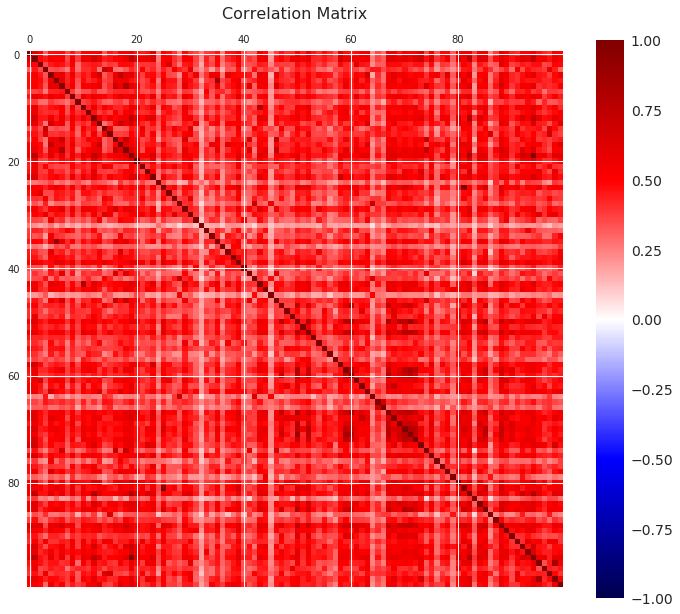

In [248]:
src.plot.corr_heatmap(df_volas.corr())

In [204]:
A = fevd.decompose_pct(10)

In [205]:
B = (A + A.T)/2

In [206]:
src.utils.matrix_asymmetry(A)

0.05755638301049168

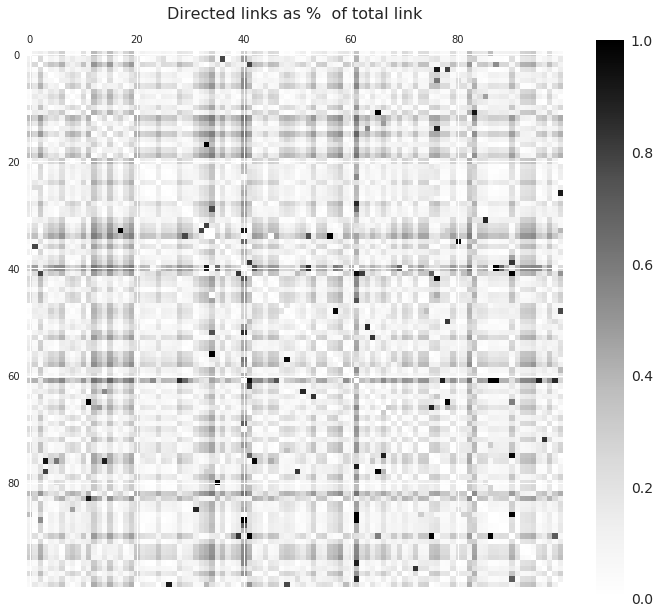

In [213]:
src.plot.corr_heatmap(abs(A/B-1), vmin=0, vmax=1, title='Directed links as %  of total link', cmap='Greys')

In [288]:
from sklearn.decomposition import FactorAnalysis
factors = pd.DataFrame(FactorAnalysis(n_components=1).fit_transform(df_est))
favar = src.FAVAR(df_est, factors, p_lags=1)

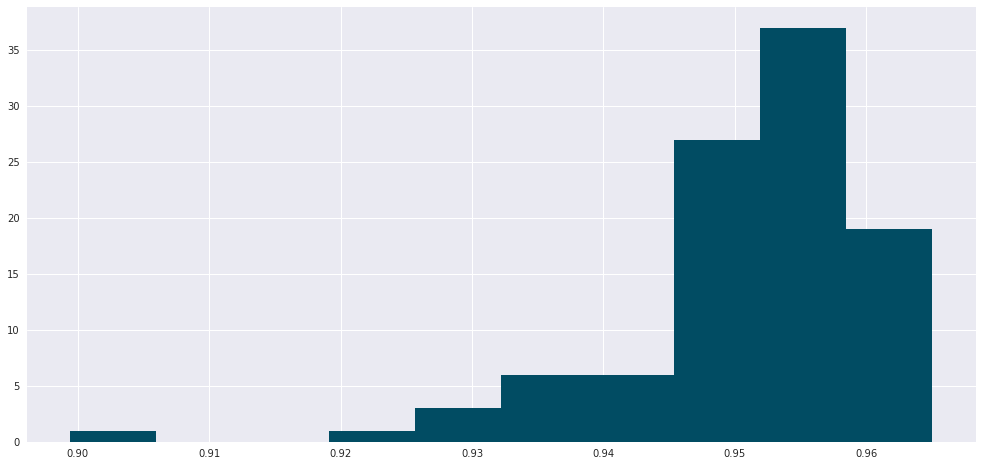

In [29]:
pd.Series(fevd.in_connectedness(horizon=horizon).ravel()).hist()
plt.show()

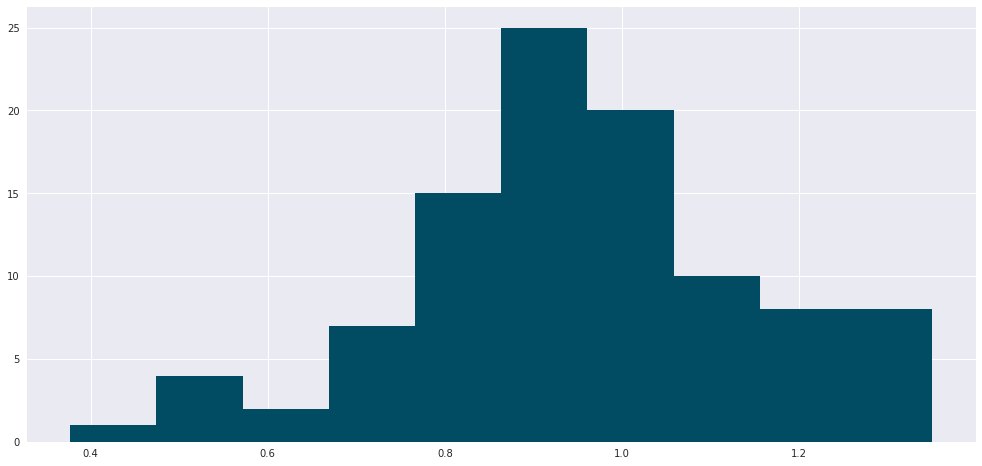

In [30]:
pd.Series(fevd.out_connectedness(horizon=horizon).ravel()).hist()
plt.show()

In [239]:
fevd_10 = fevd.summarize(10)

In [221]:
create_results_data(df_est, df_ana, favar, cv, fevd, horizon).corr().round(4)

,mean_est_ret,mean_ana_ret,beta,alpha,in_connectedness,out_connectedness,fev_others,fev_all,average_connectedness
mean_est_ret,1.0000,0.7661,0.7386,0.9828,0.5047,0.4252,0.7904,0.8787,-0.0
mean_ana_ret,0.7661,1.0000,0.3735,0.7396,0.2095,0.1602,0.4733,0.6671,0.0
beta,0.7386,0.3735,1.0000,0.7332,0.7618,0.6978,0.7671,0.5764,0.0
alpha,0.9828,0.7396,0.7332,1.0000,0.4952,0.4167,0.7896,0.8514,-0.0
in_connectedness,0.5047,0.2095,0.7618,0.4952,1.0000,0.9618,0.7304,0.3223,-0.0
out_connectedness,0.4252,0.1602,0.6978,0.4167,0.9618,1.0000,0.7281,0.2682,0.0
fev_others,0.7904,0.4733,0.7671,0.7896,0.7304,0.7281,1.0000,0.7775,0.0
fev_all,0.8787,0.6671,0.5764,0.8514,0.3223,0.2682,0.7775,1.0000,0.0
average_connectedness,-0.0000,0.0000,0.0000,-0.0000,-0.0000,0.0000,0.0000,0.0000,1.0


## Analysis

In [71]:
def create_results_data(df_est, df_ana, favar, cv, fevd, horizon): #graph
    '''Creates a dataframe containing estimation results.'''
    df = pd.DataFrame(index=favar.var_data.columns)
    df['mean_est_ret'] = df_est.mean()*252
    df['mean_ana_ret'] = df_ana.mean()*252
    df['beta'] = favar.factor_loadings_
    df['alpha'] = favar.intercepts_
    df['in_connectedness'] = fevd.in_connectedness(horizon=horizon)
    df['out_connectedness'] = fevd.out_connectedness(horizon=horizon)
    df['fev_others'] = fevd.fev_others(horizon=horizon)
    df['fev_all'] = fevd.fev_all(horizon=horizon)
    df['average_connectedness'] = fevd.average_connectedness(horizon=horizon) 
    #df['eigenvector_centrality'] = np.linalg.eig(favar.residual_cov_('LW'))[1][:,0]
    #df['network_centraility'] = nx.eigenvector_centrality(graph)
    
    return df

In [581]:
def estimate_single_year(year, selected_factors, grid, horizon):
    
    # load data
    df_est, df_ana, df_factors_est, df_factors_ana = src.loader.load_year_all(year)
    fac_est, fac_ana = src.loader.select_factor_data(df_factors_est, df_factors_ana, selected_factors=selected_factors)
    
    # favar
    favar = src.FAVAR(df_est, fac_est, p_lags=1)
    cv = favar.fit_elastic_net_cv(grid=hyperparameter_grid, return_cv=True)
    
    # fevd
    fevd = src.FEVD(favar.var_1_matrix_, favar.residual_cov_('LW'))
    
    # save results
    df_year = create_results_data(df_est, df_ana, favar, cv, fevd, horizon)
    
    return df_year
    

In [580]:
def estimate_single_year_vola(year, selected_factors, grid, horizon):
    
    # load data
    df_est, df_ana, df_factors_est, df_factors_ana = src.loader.load_year_all_vola(year)
    fac_est, fac_ana = src.loader.select_factor_data(df_factors_est, df_factors_ana, selected_factors=selected_factors)
    
    # favar
    favar = src.FAVAR(df_est, fac_est, p_lags=1)
    cv = favar.fit_elastic_net_cv(grid=hyperparameter_grid, return_cv=True)
    
    # fevd
    fevd = src.FEVD(favar.var_1_matrix_, favar.residual_cov_('LW'))
    
    # save results
    df_year = create_results_data(df_est, df_ana, favar, cv, fevd, horizon)
    
    return df_year
    

In [92]:
df_results = pd.DataFrame([])
for year in range(2000, 2019):
    df_year = estimate_single_year(year=year, selected_factors=['mktrf'], grid=hyperparameter_grid, horizon=10)
    df_year.index = pd.MultiIndex.from_product([[year], df_year.index])
    
    df_results = df_results.append(df_year)
    df_results.to_csv('../data/interim/df_results.csv')
    print('finished year {}'.format(year))

Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   32.7s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  6.5min finished


finished year 2000
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   38.4s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  7.5min finished


finished year 2001
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   39.2s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  7.2min finished


finished year 2002
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   37.3s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  6.6min finished


finished year 2003
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   32.9s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  5.3min finished


finished year 2004
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   30.3s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  4.7min finished


finished year 2005
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   30.4s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  4.8min finished


finished year 2006
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   35.3s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  5.5min finished


finished year 2007
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   31.1s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  6.1min finished


finished year 2008
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   33.1s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  7.8min finished


finished year 2009
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   30.4s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  8.1min finished


finished year 2010
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   30.4s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  5.2min finished


finished year 2011
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   29.8s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  4.7min finished


finished year 2012
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   36.3s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  5.0min finished


finished year 2013
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  7.2min finished


finished year 2014
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   32.5s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  5.3min finished


finished year 2015
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   30.7s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  7.1min finished


finished year 2016
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   33.4s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  4.7min finished


finished year 2017
Fitting 10 folds for each of 195 candidates, totalling 1950 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   32.0s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 1950 out of 1950 | elapsed:  5.8min finished


finished year 2018


In [148]:
kf.FinancialDataFrame(df_results) \
    .fit_linear_regression('mean_est_ret', ['beta', 'in_connectedness', 'fev_others']) \
    .summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           mean_est_ret   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     13.54
Date:                Tue, 29 Sep 2020   Prob (F-statistic):           9.62e-09
Time:                        13:22:12   Log-Likelihood:                -234.52
No. Observations:                1900   AIC:                             477.0
Df Residuals:                    1896   BIC:                             499.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.1507      0.027      5.631      0.000       0.098       0.203
beta                 0.0783      0.016      4.831      0.000       0.047       0.110
in_connectedness    -0.1803      0.050     -3.627      0.000      -0.278      -0.083
fev_others         -11.7620     13.845     -0.850      0.396     -38.915      15.391
==============================================================================
Omnibus:                      155.409   Durbin-Watson:                   1.532
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              887.275
Skew:                           0.070   Prob(JB):                    2.14e-193
Kurtosis:                       6.345   Cond. No.                     3.30e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.3e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [97]:
kf.FinancialDataFrame(df_results) \
    .fit_linear_regression('mean_ana_ret', ['beta', 'alpha', 'in_connectedness', 'fev_others']) \
    .summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           mean_ana_ret   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.3150
Date:                Mon, 28 Sep 2020   Prob (F-statistic):              0.868
Time:                        23:41:02   Log-Likelihood:                -1685.1
No. Observations:                1896   AIC:                             3380.
Df Residuals:                    1891   BIC:                             3408.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.1008      0.058      1.740      0.082      -0.013       0.214
beta                -0.0221      0.035     -0.631      0.528      -0.091       0.047
alpha               -9.4724     14.639     -0.647      0.518     -38.182      19.237
in_connectedness     0.0411      0.107      0.384      0.701      -0.169       0.251
fev_others          16.4674     30.917      0.533      0.594     -44.168      77.103
==============================================================================
Omnibus:                     4666.037   Durbin-Watson:                   1.866
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         70336179.752
Skew:                          25.009   Prob(JB):                         0.00
Kurtosis:                     945.247   Cond. No.                     3.44e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.44e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [98]:
kf.FinancialDataFrame(df_results) \
    .fit_linear_regression('beta', ['alpha', 'in_connectedness', 'fev_others']) \
    .summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   beta   R-squared:                       0.121
Model:                            OLS   Adj. R-squared:                  0.120
Method:                 Least Squares   F-statistic:                     87.36
Date:                Mon, 28 Sep 2020   Prob (F-statistic):           6.04e-53
Time:                        23:42:30   Log-Likelihood:                -890.04
No. Observations:                1900   AIC:                             1788.
Df Residuals:                    1896   BIC:                             1810.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.9400      0.031     30.108      0.000       0.879       1.001
alpha              -32.0714      9.568     -3.352      0.001     -50.837     -13.306
in_connectedness    -0.0735      0.070     -1.047      0.295      -0.211       0.064
fev_others         265.1943     18.884     14.043      0.000     228.158     302.231
==============================================================================
Omnibus:                       14.657   Durbin-Watson:                   1.673
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               21.546
Skew:                          -0.017   Prob(JB):                     2.10e-05
Kurtosis:                       3.521   Cond. No.                     2.36e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.36e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""